In [ ]:
import os, random, time, math, gc
from glob import glob
from collections import Counter, defaultdict

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.auto import tqdm

import cv2
from skimage import exposure, color

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision import transforms
from torchvision.datasets import ImageFolder

from sklearn.metrics import (classification_report, confusion_matrix, roc_curve,
                             roc_auc_score, accuracy_score, precision_recall_fscore_support)
from sklearn.preprocessing import label_binarize
from imblearn.over_sampling import SMOTE

import timm

# Mixed precision
from torch.cuda.amp import GradScaler, autocast

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
DATA_DIR = '/content/drive/MyDrive/eye_disease/dataset'
OUT_DIR = '/content/drive/MyDrive/eye_models'
os.makedirs(OUT_DIR, exist_ok=True)

CLASS_NAMES = sorted([d for d in os.listdir(DATA_DIR) if os.path.isdir(os.path.join(DATA_DIR, d))])
NUM_CLASSES = len(CLASS_NAMES)
print('Classes:', CLASS_NAMES, 'Num classes:', NUM_CLASSES)

# Repro
SEED = 42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Device:', device)

# Hyperparams
IMG_SIZE = 224
BATCH_SIZE = 32
MAX_EPOCHS = 60
PATIENCE = 5
INIT_LR = 3e-4

Classes: ['cataract', 'diabetic_retinopathy', 'glaucoma', 'normal'] Num classes: 4
Device: cuda


Class counts: Counter({'diabetic_retinopathy': 1098, 'normal': 1074, 'cataract': 1038, 'glaucoma': 1007})


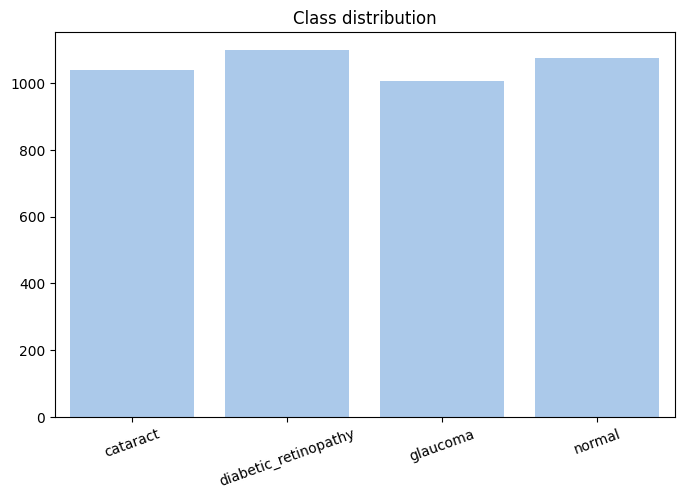

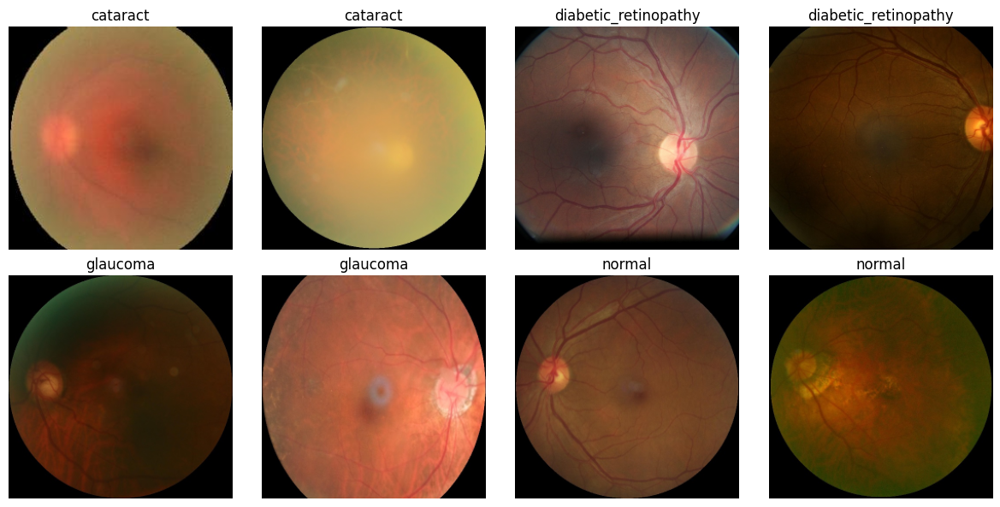

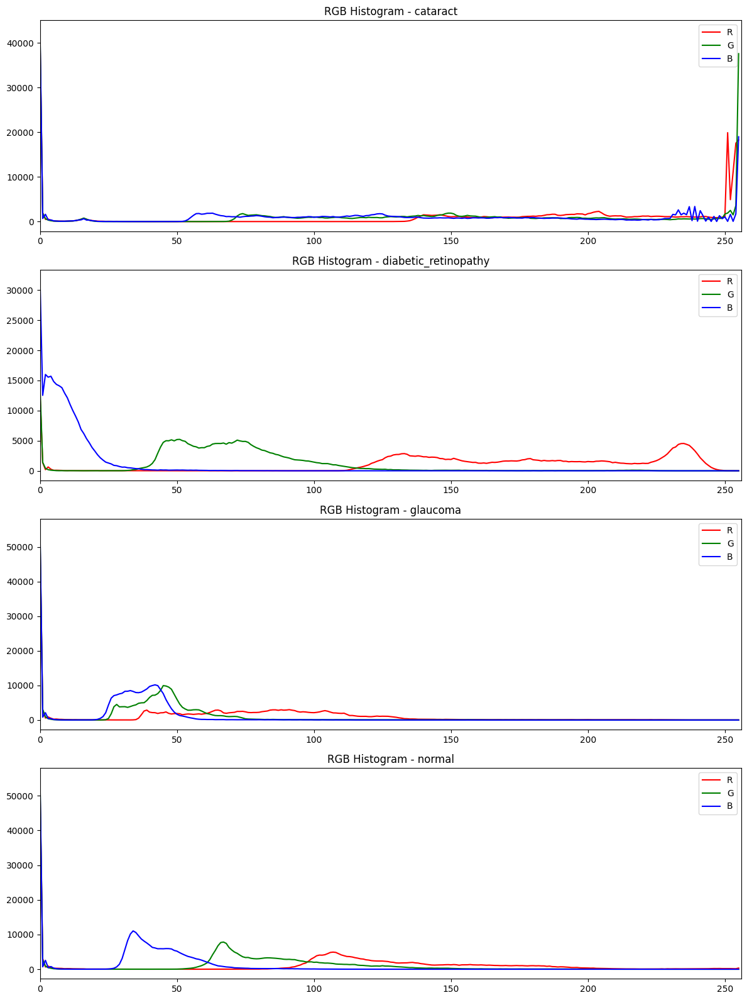

In [ ]:
# Cell 3 — visualization style + simple helpers
plt.rcParams['figure.facecolor'] = 'white'
sns.set_palette('pastel')

def show_grid(images, titles=None, cols=4, figsize=(12,8)):
    rows = math.ceil(len(images)/cols)
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    axes = axes.ravel() if hasattr(axes, 'ravel') else [axes]
    for i in range(rows*cols):
        ax = axes[i]
        if i < len(images):
            img = images[i]
            ax.imshow(np.clip(img,0,1))
            ax.set_axis_off()
            if titles: ax.set_title(titles[i])
        else:
            ax.set_axis_off()
    plt.tight_layout()
    plt.show()

# EDA: class counts
full_ds = ImageFolder(DATA_DIR)
idx_to_class = {v:k for k,v in full_ds.class_to_idx.items()}
counts = Counter([idx_to_class[label] for _, label in full_ds.imgs])
print('Class counts:', counts)

plt.figure(figsize=(8,5))
sns.barplot(x=list(counts.keys()), y=list(counts.values()))
plt.title('Class distribution')
plt.xticks(rotation=20)
plt.show()

# Show 2 samples per class
samples, sample_titles = [], []
for cls in CLASS_NAMES:
    paths = glob(os.path.join(DATA_DIR, cls, '*'))
    pick = random.sample(paths, k=min(2, len(paths)))
    for p in pick:
        img = cv2.cvtColor(cv2.imread(p), cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (256,256))
        samples.append(img/255.0)
        sample_titles.append(cls)
show_grid(samples, sample_titles, cols=4, figsize=(12,6))

# RGB histograms for 6 random images
plt.figure(figsize=(12, 4*len(CLASS_NAMES)))

for i, cls in enumerate(CLASS_NAMES):
    # Pick one image from the class folder
    img_path = os.path.join(DATA_DIR, cls, os.listdir(os.path.join(DATA_DIR, cls))[0])
    img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)

    plt.subplot(len(CLASS_NAMES), 1, i+1)
    for c, col in enumerate(['r','g','b']):
        hist = cv2.calcHist([img], [c], None, [256], [0,256])
        plt.plot(hist, color=col, label=col.upper())
    plt.title(f"RGB Histogram - {cls}")
    plt.xlim([0,256])
    plt.legend()

plt.tight_layout()
plt.show()

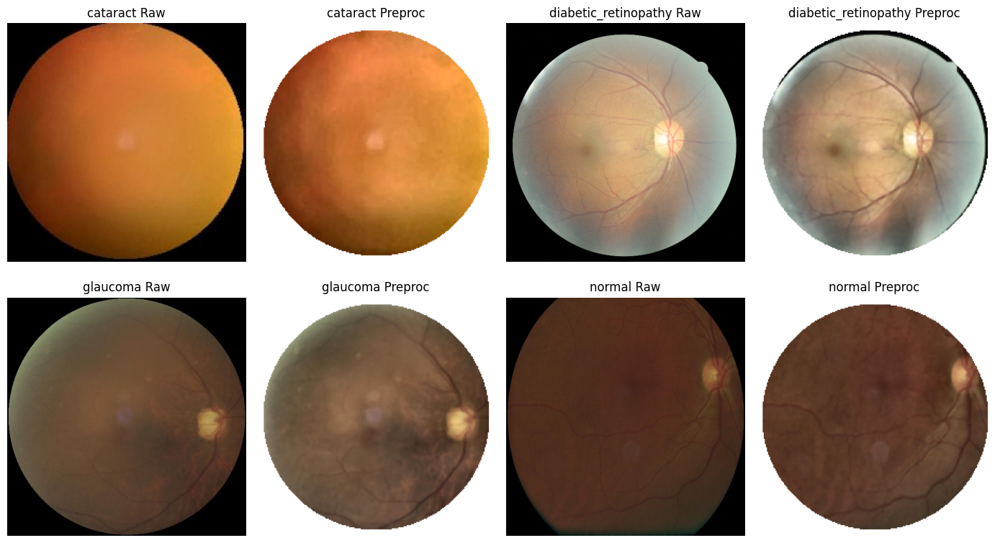

In [ ]:
# Cell 4 — preprocessing functions
def apply_clahe_rgb(img_rgb):
    lab = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2LAB)
    l,a,b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    l = clahe.apply(l)
    lab = cv2.merge([l,a,b])
    out = cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)
    return out

def remove_background(img_rgb):
    h,w = img_rgb.shape[:2]
    mask = np.zeros((h,w), np.uint8)
    r = int(min(h,w)//2.1)
    cv2.circle(mask, (w//2, h//2), r, 255, -1)
    out = cv2.bitwise_and(img_rgb, img_rgb, mask=mask)
    bg = np.ones_like(img_rgb)*255
    inv = cv2.bitwise_not(mask)
    bg = cv2.bitwise_and(bg,bg,mask=inv)
    return out + bg

def denoise(img_rgb, method='median', k=3):
    if method=='median':
        return cv2.medianBlur(img_rgb, k)
    else:
        return cv2.GaussianBlur(img_rgb, (k|1, k|1), 0)

def preprocess_full(img_rgb):
    img = cv2.resize(img_rgb, (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_AREA)
    img = remove_background(img)
    img = apply_clahe_rgb(img)
    img = denoise(img, method='median', k=3)
    img = np.clip(img, 0, 255).astype(np.uint8)
    return img

# Demo: show raw vs preprocessed for one per class
demo_imgs = []
demo_titles = []
for cls in CLASS_NAMES:
    paths = glob(os.path.join(DATA_DIR, cls, '*'))
    if not paths: continue
    p = random.choice(paths)
    raw = cv2.cvtColor(cv2.imread(p), cv2.COLOR_BGR2RGB)
    pp = preprocess_full(raw)
    demo_imgs.extend([raw/255.0, pp/255.0])
    demo_titles.extend([f'{cls} Raw', f'{cls} Preproc'])
show_grid(demo_imgs[:8], demo_titles[:8], cols=4, figsize=(14,8))


In [ ]:
# Cell 5 — Dataset class and transforms
class FundusDataset(Dataset):
    def __init__(self, img_paths, labels, augment=False):
        self.img_paths = img_paths
        self.labels = labels
        self.augment = augment
        self.tf = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225])
        ])

    def __len__(self):
        return len(self.img_paths)

    def __getitem__(self, idx):
        p = self.img_paths[idx]
        y = self.labels[idx]
        img = cv2.cvtColor(cv2.imread(p), cv2.COLOR_BGR2RGB)
        img = preprocess_full(img)
        if self.augment:
            if random.random()<0.5:
                img = cv2.flip(img, 1)
            if random.random()<0.2:
                M = cv2.getRotationMatrix2D((IMG_SIZE//2, IMG_SIZE//2), random.choice([-10,-5,5,10]), 1.0)
                img = cv2.warpAffine(img, M, (IMG_SIZE, IMG_SIZE), borderMode=cv2.BORDER_REFLECT)
        x = self.tf(img)
        return x, y

In [ ]:
# Cell 6 — Train/Val/Test split
all_paths = [p for p,_ in full_ds.imgs]
all_labels = [l for _,l in full_ds.imgs]

per_class = defaultdict(list)
for i, y in enumerate(all_labels):
    per_class[y].append(i)

train_idx, val_idx, test_idx = [], [], []
for y, idxs in per_class.items():
    random.shuffle(idxs)
    n = len(idxs)
    n_train = int(0.7*n)
    n_val   = int(0.2*n)
    n_test  = n - n_train - n_val
    train_idx.extend(idxs[:n_train])
    val_idx.extend(idxs[n_train:n_train+n_val])
    test_idx.extend(idxs[n_train+n_val:])

X_train = [all_paths[i] for i in train_idx]; y_train = [all_labels[i] for i in train_idx]
X_val   = [all_paths[i] for i in val_idx];   y_val   = [all_labels[i] for i in val_idx]
X_test  = [all_paths[i] for i in test_idx];  y_test  = [all_labels[i] for i in test_idx]

print('Split sizes:', len(X_train), len(X_val), len(X_test))

# Weighted sampler for data loader
train_counts = Counter(y_train)
class_weights = {c: len(y_train)/train_counts[c] for c in train_counts}
weights = torch.DoubleTensor([class_weights[y] for y in y_train])
train_sampler = WeightedRandomSampler(weights, num_samples=len(weights), replacement=True)

train_ds = FundusDataset(X_train, y_train, augment=True)
val_ds   = FundusDataset(X_val, y_val, augment=False)
test_ds  = FundusDataset(X_test, y_test, augment=False)

train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, sampler=train_sampler, num_workers=2, pin_memory=True)
val_loader   = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)
test_loader  = DataLoader(test_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

Split sizes: 2949 841 427


In [ ]:
# Cell 7 — SMOTE demo (extract embeddings from small model, balance, quick baseline)
smote_model_name = 'resnet18'
emb_model = timm.create_model(smote_model_name, pretrained=True, num_classes=0).to(device)
emb_model.eval()

@torch.no_grad()
def extract_embeddings(dataloader, model):
    feats, labels = [], []
    for x, y in tqdm(dataloader, desc='Extract feats'):
        x = x.to(device)
        with autocast(enabled=torch.cuda.is_available()):
            f = model(x)
        feats.append(f.float().cpu().numpy()); labels.append(y.numpy())
    return np.concatenate(feats, axis=0), np.concatenate(labels, axis=0)

# Use train_ds (which has augmentation) but here use a simple loader without sampler to get deterministic embedding set
emb_loader = DataLoader(FundusDataset(X_train, y_train, augment=False), batch_size=BATCH_SIZE, shuffle=False)
train_feats, train_lbls = extract_embeddings(emb_loader, emb_model)
print('Embeddings shape:', train_feats.shape)

sm = SMOTE(random_state=SEED)
feats_bal, lbls_bal = sm.fit_resample(train_feats, train_lbls)
print('After SMOTE class counts:', Counter(lbls_bal))

model.safetensors:   0%|          | 0.00/46.8M [00:00<?, ?B/s]

Extract feats:   0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3089210562.py:11: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Embeddings shape: (2949, 512)
After SMOTE class counts: Counter({np.int64(0): 768, np.int64(1): 768, np.int64(2): 768, np.int64(3): 768})


In [ ]:
# Cell 8 — model list and builder
MODEL_LIST = [
    ('resnet50',              'ResNet50'),
    ('convnext_tiny',         'ConvNeXt-Tiny'),
    ('densenet169',           'DenseNet169'),
    ('efficientnet_b0',       'EfficientNet-B0'),
    ('alexnet',               'AlexNet'),
    ('vgg19',                 'VGG19'),
    ('resnext101_32x8d',      'ResNeXt-101'),
    ('mobilenetv2_100',       'MobileNetV2'),
    ('squeezenet1_1',         'SqueezeNet1.1'),
    ('coat_lite_tiny',        'CoaT-LiteTiny'),
    ('eva02_base_patch14_224', 'EVA-02-B'),
    ('maxvit_tiny_tf_224',    'MaxViT-Tiny'),
    ('cait_xxs24_224',        'CaiT-XXS-24'),
    ('efficientnetv2_s',      'EfficientNet-V2-S'),
    ('gmlp_ti16_224',         'gMLP-Tiny'),
    ('beit_base_patch16_224', 'BEiT-B'),
    ('vit_base_patch16_224',  'ViT-B/16'),
]

def build_model(model_name, num_classes):
    # timm handles many model names; returns pytorch model
    model = timm.create_model(model_name, pretrained=True, num_classes=num_classes)
    return model

In [ ]:
# Cell 9 — training utilities
class EarlyStopping:
    def __init__(self, patience=5, mode='max', delta=1e-6):
        self.patience = patience
        self.counter = 0
        self.best = -np.inf if mode == 'max' else np.inf
        self.early_stop = False
        self.mode = mode
        self.delta = delta

    def step(self, metric):
        improve = (metric > self.best + self.delta) if self.mode == 'max' else (metric < self.best - self.delta)
        if improve:
            self.best = metric
            self.counter = 0
            return True
        else:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
            return False


def epoch_pass(model, loader, criterion, optimizer=None, scaler=None):
    train_mode = optimizer is not None
    if train_mode:
        model.train()
    else:
        model.eval()

    epoch_loss, epoch_correct, epoch_total = 0.0, 0, 0
    all_preds, all_targets, all_probs = [], [], []
    pbar = tqdm(loader, leave=False)
    for x, y in pbar:
        x = x.to(device)
        y = y.to(device)
        if train_mode:
            optimizer.zero_grad(set_to_none=True)
        with autocast(enabled=torch.cuda.is_available()):
            logits = model(x)
            loss = criterion(logits, y)
        if train_mode:
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
        probs = F.softmax(logits, dim=1).detach()
        preds = probs.argmax(1)
        epoch_loss += loss.item() * x.size(0)
        epoch_correct += (preds == y).sum().item()
        epoch_total += x.size(0)
        all_preds.append(preds.cpu())
        all_targets.append(y.cpu())
        all_probs.append(probs.cpu())

    avg_loss = epoch_loss / (epoch_total + 1e-9)
    acc = epoch_correct / (epoch_total + 1e-9)
    all_preds = torch.cat(all_preds).numpy()
    all_targets = torch.cat(all_targets).numpy()
    all_probs = torch.cat(all_probs).numpy()
    prec, rec, f1, _ = precision_recall_fscore_support(
        all_targets, all_preds, average='macro', zero_division=0
    )
    return avg_loss, acc, f1, (all_targets, all_preds, all_probs)


def train_one_model(model_name, model_pretty):
    print(f'\n===== Training {model_pretty} ({model_name}) =====')
    model = build_model(model_name, NUM_CLASSES).to(device)

    optimizer = torch.optim.AdamW(model.parameters(), lr=INIT_LR, weight_decay=1e-4)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='max', factor=0.5, patience=2
    )
    criterion = nn.CrossEntropyLoss()
    scaler = GradScaler(enabled=torch.cuda.is_available())

    es = EarlyStopping(patience=PATIENCE, mode='max')
    history = []
    best_state = None
    best_val_acc = -np.inf

    for epoch in range(1, MAX_EPOCHS + 1):
        print(f'Epoch {epoch}/{MAX_EPOCHS}')
        t0 = time.time()
        train_loss, train_acc, train_f1, _ = epoch_pass(model, train_loader, criterion, optimizer, scaler)
        val_loss, val_acc, val_f1, _ = epoch_pass(model, val_loader, criterion)
        dt = time.time() - t0

        scheduler.step(val_acc)
        history.append({
            'epoch': epoch,
            'train_loss': train_loss,
            'train_acc': train_acc,
            'val_loss': val_loss,
            'val_acc': val_acc,
            'train_f1': train_f1,
            'val_f1': val_f1,
            'lr': optimizer.param_groups[0]['lr'],
            'time_sec': dt
        })
        print(f"Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f} | Val F1: {val_f1:.4f} | LR: {optimizer.param_groups[0]['lr']:.2e}")

        if val_acc > best_val_acc + 1e-6:
            best_val_acc = val_acc
            best_state = {k: v.cpu() for k, v in model.state_dict().items()}
            save_path = os.path.join(OUT_DIR, f"{model_pretty.replace(' ', '_')}_best.pth")
            torch.save(best_state, save_path)
            print('  ↳ New best model saved:', save_path)
        if not es.step(val_acc):
            pass
        if es.early_stop:
            print('Early stopping triggered.')
            break

    # Load best and evaluate on test
    if best_state is not None:
        try:
            model.load_state_dict({k: v.to(device) for k, v in best_state.items()}, strict=False)
        except Exception as e:
            print('Warning: loading best_state with strict=False ->', e)

    _, _, _, (y_true, y_pred, y_prob) = epoch_pass(model, test_loader, criterion)
    test_acc = accuracy_score(y_true, y_pred)
    prec, rec, f1, _ = precision_recall_fscore_support(
        y_true, y_pred, average='macro', zero_division=0
    )

    hist_df = pd.DataFrame(history)
    hist_df.to_csv(os.path.join(OUT_DIR, f"{model_pretty.replace(' ', '_')}_history.csv"), index=False)
    report = classification_report(
        y_true, y_pred, target_names=CLASS_NAMES, output_dict=True, zero_division=0
    )
    pd.DataFrame(report).transpose().to_csv(os.path.join(OUT_DIR, f"{model_pretty.replace(' ', '_')}_report.csv"))

    # Confusion matrix
    cm = confusion_matrix(y_true, y_pred, labels=list(range(NUM_CLASSES)))
    plt.figure(figsize=(5.5, 4.5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Greens',
                xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES)
    plt.title(f'{model_pretty} — Confusion Matrix (Test)')
    plt.ylabel('True')
    plt.xlabel('Predicted')
    plt.tight_layout()
    plt.show()

    # ROC OVR
    y_true_bin = label_binarize(y_true, classes=list(range(NUM_CLASSES)))
    try:
        auc_macro = roc_auc_score(y_true_bin, y_prob, average='macro', multi_class='ovr')
    except Exception:
        auc_macro = np.nan
    plt.figure(figsize=(6, 5))
    for i in range(NUM_CLASSES):
        fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_prob[:, i])
        plt.plot(fpr, tpr, label=f'{CLASS_NAMES[i]}')
    plt.plot([0, 1], [0, 1], '--', lw=1)
    plt.title(f'{model_pretty} — ROC (AUC macro={auc_macro:.3f})')
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    plt.legend()
    plt.grid(True, alpha=0.2)
    plt.tight_layout()
    plt.show()

    return {
        'Model': model_pretty,
        'Best Val Acc': float(best_val_acc),
        'Test Acc': float(test_acc),
        'Test Precision(Macro)': float(prec),
        'Test Recall(Macro)': float(rec),
        'Test F1(Macro)': float(f1)
    }


===== Training ResNet50 (resnet50) =====
Epoch 1/60


/tmp/ipython-input-3870945229.py:75: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=torch.cuda.is_available())


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.6524 | Val Acc: 0.7967 | Val F1: 0.7971 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ResNet50_best.pth
Epoch 2/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8427 | Val Acc: 0.8181 | Val F1: 0.8156 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ResNet50_best.pth
Epoch 3/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8973 | Val Acc: 0.8763 | Val F1: 0.8754 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ResNet50_best.pth
Epoch 4/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9335 | Val Acc: 0.8716 | Val F1: 0.8699 | LR: 3.00e-04
Epoch 5/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ad57d62a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ad57d62a0>
Traceback (most recent call last):
  File "

Train Acc: 0.9346 | Val Acc: 0.8882 | Val F1: 0.8871 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ResNet50_best.pth
Epoch 6/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9498 | Val Acc: 0.8763 | Val F1: 0.8754 | LR: 3.00e-04
Epoch 7/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9549 | Val Acc: 0.8918 | Val F1: 0.8913 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ResNet50_best.pth
Epoch 8/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ad57d62a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ad57d62a0>
Traceback (most recent call last):
  File "

Train Acc: 0.9586 | Val Acc: 0.8954 | Val F1: 0.8949 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ResNet50_best.pth
Epoch 9/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9681 | Val Acc: 0.8954 | Val F1: 0.8945 | LR: 3.00e-04
Epoch 10/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9725 | Val Acc: 0.8859 | Val F1: 0.8851 | LR: 3.00e-04
Epoch 11/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ad57d62a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ad57d62a0>
Traceback (most recent call last):
  File "

  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9742 | Val Acc: 0.9049 | Val F1: 0.9053 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ResNet50_best.pth
Epoch 12/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9803 | Val Acc: 0.9144 | Val F1: 0.9134 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ResNet50_best.pth
Epoch 13/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ad57d62a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ad57d62a0>
Traceback (most recent call last):
  File "

Train Acc: 0.9807 | Val Acc: 0.9037 | Val F1: 0.9025 | LR: 3.00e-04
Epoch 14/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9817 | Val Acc: 0.9144 | Val F1: 0.9140 | LR: 3.00e-04
Epoch 15/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9864 | Val Acc: 0.9061 | Val F1: 0.9059 | LR: 1.50e-04
Epoch 16/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9922 | Val Acc: 0.9108 | Val F1: 0.9104 | LR: 1.50e-04
Epoch 17/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ad57d62a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ad57d62a0>
Traceback (most recent call last):
  File "

Train Acc: 0.9949 | Val Acc: 0.9191 | Val F1: 0.9194 | LR: 1.50e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ResNet50_best.pth
Epoch 18/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9925 | Val Acc: 0.9120 | Val F1: 0.9121 | LR: 1.50e-04
Epoch 19/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9895 | Val Acc: 0.9203 | Val F1: 0.9201 | LR: 1.50e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ResNet50_best.pth
Epoch 20/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9925 | Val Acc: 0.9144 | Val F1: 0.9144 | LR: 1.50e-04
Epoch 21/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9922 | Val Acc: 0.9144 | Val F1: 0.9143 | LR: 1.50e-04
Epoch 22/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9949 | Val Acc: 0.9120 | Val F1: 0.9112 | LR: 7.50e-05
Epoch 23/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9980 | Val Acc: 0.9203 | Val F1: 0.9197 | LR: 7.50e-05
Epoch 24/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9969 | Val Acc: 0.9108 | Val F1: 0.9104 | LR: 7.50e-05
Early stopping triggered.


  0%|          | 0/14 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


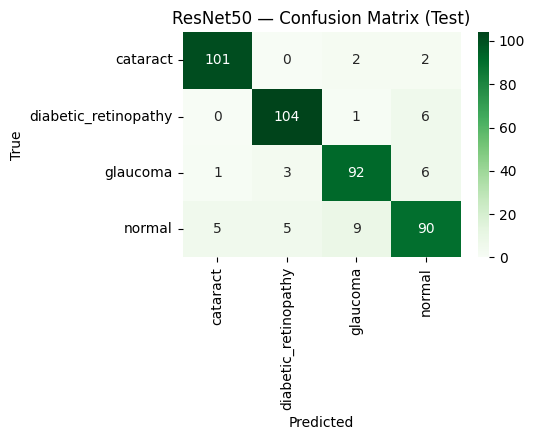

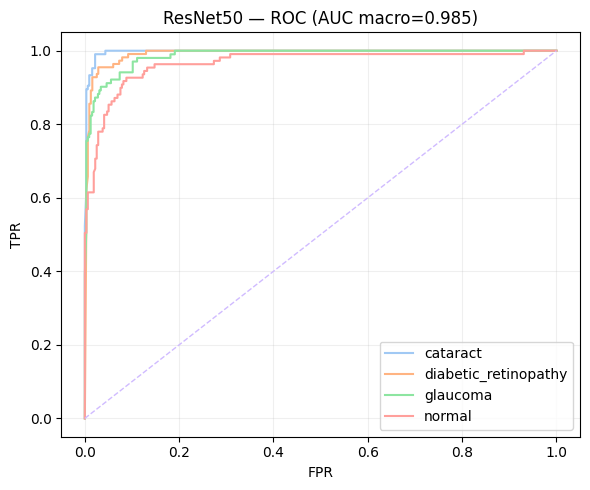

,Model,Best Val Acc,Test Acc,Test Precision(Macro),Test Recall(Macro),Test F1(Macro)
0,ResNet50,0.920333,0.906323,0.905624,0.906623,0.90596


In [ ]:
# Block: ResNet50
res = train_one_model('resnet50', 'ResNet50')
pd.DataFrame([res])


===== Training ConvNeXt-Tiny (convnext_tiny) =====


model.safetensors:   0%|          | 0.00/114M [00:00<?, ?B/s]

Epoch 1/60


/tmp/ipython-input-3870945229.py:75: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=torch.cuda.is_available())


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.3415 | Val Acc: 0.5351 | Val F1: 0.4488 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ConvNeXt-Tiny_best.pth
Epoch 2/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ad57d62a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ad57d62a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Train Acc: 0.6022 | Val Acc: 0.7051 | Val F1: 0.7064 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ConvNeXt-Tiny_best.pth
Epoch 3/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.6931 | Val Acc: 0.5696 | Val F1: 0.4934 | LR: 3.00e-04
Epoch 4/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7219 | Val Acc: 0.6599 | Val F1: 0.6333 | LR: 3.00e-04
Epoch 5/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7467 | Val Acc: 0.7848 | Val F1: 0.7824 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ConvNeXt-Tiny_best.pth
Epoch 6/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ad57d62a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ad57d62a0>
Traceback (most recent call last):
  File "

Train Acc: 0.7976 | Val Acc: 0.7788 | Val F1: 0.7697 | LR: 3.00e-04
Epoch 7/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8081 | Val Acc: 0.7967 | Val F1: 0.7992 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ConvNeXt-Tiny_best.pth
Epoch 8/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8366 | Val Acc: 0.8347 | Val F1: 0.8325 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ConvNeXt-Tiny_best.pth
Epoch 9/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8410 | Val Acc: 0.8276 | Val F1: 0.8306 | LR: 3.00e-04
Epoch 10/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ad57d62a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ad57d62a0>
Traceback (most recent call last):
  File "

Train Acc: 0.8708 | Val Acc: 0.8704 | Val F1: 0.8696 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ConvNeXt-Tiny_best.pth
Epoch 11/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8966 | Val Acc: 0.8395 | Val F1: 0.8357 | LR: 3.00e-04
Epoch 12/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8793 | Val Acc: 0.8751 | Val F1: 0.8761 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ConvNeXt-Tiny_best.pth
Epoch 13/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8952 | Val Acc: 0.8537 | Val F1: 0.8525 | LR: 3.00e-04
Epoch 14/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ad57d62a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ad57d62a0>
Traceback (most recent call last):
  File "

Train Acc: 0.9261 | Val Acc: 0.8288 | Val F1: 0.8244 | LR: 3.00e-04
Epoch 15/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9362 | Val Acc: 0.8312 | Val F1: 0.8343 | LR: 1.50e-04
Epoch 16/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9552 | Val Acc: 0.8882 | Val F1: 0.8897 | LR: 1.50e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ConvNeXt-Tiny_best.pth
Epoch 17/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9681 | Val Acc: 0.8751 | Val F1: 0.8744 | LR: 1.50e-04
Epoch 18/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ad57d62a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ad57d62a0>
Traceback (most recent call last):
  File "

Train Acc: 0.9759 | Val Acc: 0.8977 | Val F1: 0.8979 | LR: 1.50e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ConvNeXt-Tiny_best.pth
Epoch 19/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9773 | Val Acc: 0.9013 | Val F1: 0.9009 | LR: 1.50e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ConvNeXt-Tiny_best.pth
Epoch 20/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9780 | Val Acc: 0.8942 | Val F1: 0.8941 | LR: 1.50e-04
Epoch 21/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9776 | Val Acc: 0.9049 | Val F1: 0.9052 | LR: 1.50e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ConvNeXt-Tiny_best.pth
Epoch 22/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ad57d62a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ad57d62a0>
Traceback (most recent call last):
  File "

Train Acc: 0.9793 | Val Acc: 0.8692 | Val F1: 0.8685 | LR: 1.50e-04
Epoch 23/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9858 | Val Acc: 0.8847 | Val F1: 0.8831 | LR: 1.50e-04
Epoch 24/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9864 | Val Acc: 0.9049 | Val F1: 0.9053 | LR: 7.50e-05
Epoch 25/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9929 | Val Acc: 0.9084 | Val F1: 0.9083 | LR: 7.50e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ConvNeXt-Tiny_best.pth
Epoch 26/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ad57d62a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ad57d62a0>
Traceback (most recent call last):
  File "

Train Acc: 0.9929 | Val Acc: 0.9132 | Val F1: 0.9131 | LR: 7.50e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ConvNeXt-Tiny_best.pth
Epoch 27/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9959 | Val Acc: 0.9037 | Val F1: 0.9026 | LR: 7.50e-05
Epoch 28/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9946 | Val Acc: 0.9120 | Val F1: 0.9127 | LR: 7.50e-05
Epoch 29/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9966 | Val Acc: 0.9203 | Val F1: 0.9200 | LR: 7.50e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ConvNeXt-Tiny_best.pth
Epoch 30/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ad57d62a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ad57d62a0>
Traceback (most recent call last):
  File "

Train Acc: 0.9912 | Val Acc: 0.8870 | Val F1: 0.8879 | LR: 7.50e-05
Epoch 31/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9963 | Val Acc: 0.9084 | Val F1: 0.9089 | LR: 7.50e-05
Epoch 32/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9939 | Val Acc: 0.9073 | Val F1: 0.9082 | LR: 3.75e-05
Epoch 33/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9980 | Val Acc: 0.9120 | Val F1: 0.9121 | LR: 3.75e-05
Epoch 34/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ad57d62a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ad57d62a0>
Traceback (most recent call last):
  File "

Train Acc: 0.9983 | Val Acc: 0.9096 | Val F1: 0.9102 | LR: 3.75e-05
Early stopping triggered.


  0%|          | 0/14 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


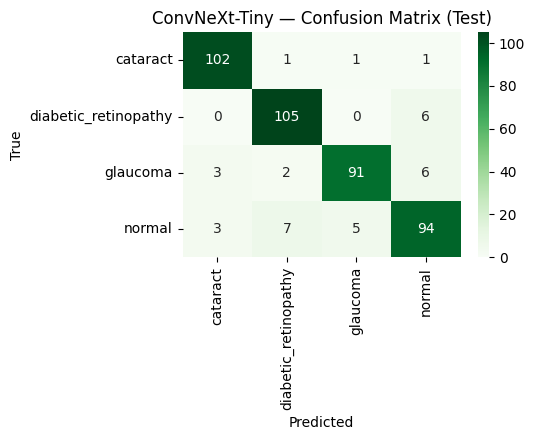

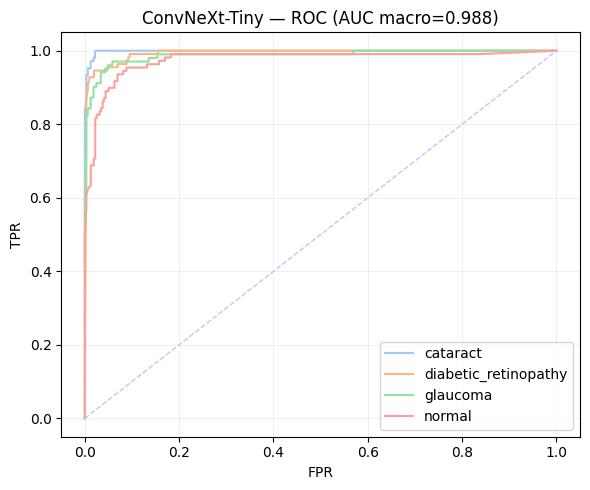

,Model,Best Val Acc,Test Acc,Test Precision(Macro),Test Recall(Macro),Test F1(Macro)
0,ConvNeXt-Tiny,0.920333,0.918033,0.918534,0.917979,0.917973


In [ ]:
# Block: ConvNeXt-Tiny
res = train_one_model('convnext_tiny', 'ConvNeXt-Tiny')
pd.DataFrame([res])


===== Training DenseNet169 (densenet169) =====


model.safetensors:   0%|          | 0.00/57.4M [00:00<?, ?B/s]

Epoch 1/60


/tmp/ipython-input-3870945229.py:75: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=torch.cuda.is_available())


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8060 | Val Acc: 0.8383 | Val F1: 0.8345 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/DenseNet169_best.pth
Epoch 2/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8752 | Val Acc: 0.7812 | Val F1: 0.7599 | LR: 3.00e-04
Epoch 3/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9040 | Val Acc: 0.8811 | Val F1: 0.8818 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/DenseNet169_best.pth
Epoch 4/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9264 | Val Acc: 0.8811 | Val F1: 0.8787 | LR: 3.00e-04
Epoch 5/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9410 | Val Acc: 0.8680 | Val F1: 0.8683 | LR: 3.00e-04
Epoch 6/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ad57d62a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ad57d62a0>
Traceback (most recent call last):
  File "

  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9383 | Val Acc: 0.8740 | Val F1: 0.8724 | LR: 1.50e-04
Epoch 7/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ad57d62a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ad57d62a0>
Traceback (most recent call last):
  File "

  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9688 | Val Acc: 0.9227 | Val F1: 0.9219 | LR: 1.50e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/DenseNet169_best.pth
Epoch 8/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9834 | Val Acc: 0.9275 | Val F1: 0.9272 | LR: 1.50e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/DenseNet169_best.pth
Epoch 9/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9891 | Val Acc: 0.9108 | Val F1: 0.9103 | LR: 1.50e-04
Epoch 10/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9844 | Val Acc: 0.9168 | Val F1: 0.9162 | LR: 1.50e-04
Epoch 11/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9813 | Val Acc: 0.9168 | Val F1: 0.9158 | LR: 7.50e-05
Epoch 12/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9888 | Val Acc: 0.9298 | Val F1: 0.9298 | LR: 7.50e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/DenseNet169_best.pth
Epoch 13/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9932 | Val Acc: 0.9322 | Val F1: 0.9315 | LR: 7.50e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/DenseNet169_best.pth
Epoch 14/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ad57d62a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ad57d62a0>
Traceback (most recent call last):
  File "

  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9953 | Val Acc: 0.9275 | Val F1: 0.9264 | LR: 7.50e-05
Epoch 15/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9915 | Val Acc: 0.9203 | Val F1: 0.9202 | LR: 7.50e-05
Epoch 16/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9888 | Val Acc: 0.9275 | Val F1: 0.9272 | LR: 3.75e-05
Epoch 17/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9953 | Val Acc: 0.9322 | Val F1: 0.9315 | LR: 3.75e-05
Epoch 18/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9993 | Val Acc: 0.9334 | Val F1: 0.9328 | LR: 3.75e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/DenseNet169_best.pth
Epoch 19/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9993 | Val Acc: 0.9358 | Val F1: 0.9353 | LR: 3.75e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/DenseNet169_best.pth
Epoch 20/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9980 | Val Acc: 0.9287 | Val F1: 0.9278 | LR: 3.75e-05
Epoch 21/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9983 | Val Acc: 0.9370 | Val F1: 0.9366 | LR: 3.75e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/DenseNet169_best.pth
Epoch 22/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9973 | Val Acc: 0.9263 | Val F1: 0.9257 | LR: 3.75e-05
Epoch 23/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ad57d62a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ad57d62a0>
Traceback (most recent call last):
  File "

  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9980 | Val Acc: 0.9346 | Val F1: 0.9342 | LR: 3.75e-05
Epoch 24/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9976 | Val Acc: 0.9263 | Val F1: 0.9258 | LR: 1.87e-05
Epoch 25/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9997 | Val Acc: 0.9298 | Val F1: 0.9293 | LR: 1.87e-05
Epoch 26/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9983 | Val Acc: 0.9251 | Val F1: 0.9246 | LR: 1.87e-05
Early stopping triggered.


  0%|          | 0/14 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


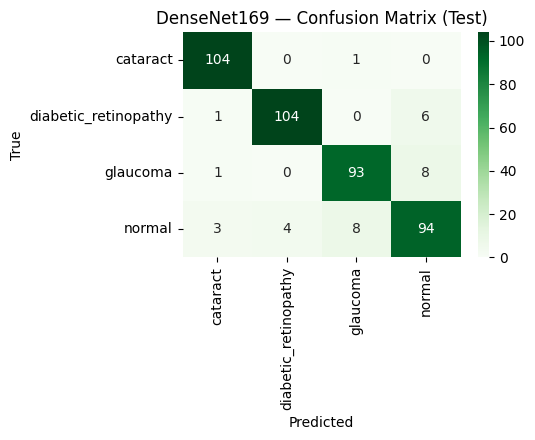

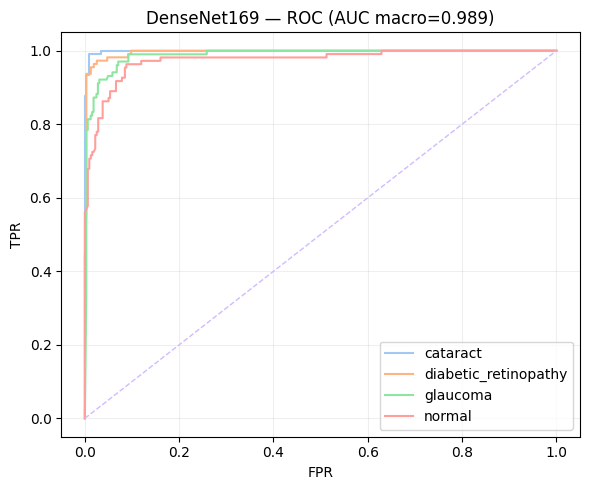

,Model,Best Val Acc,Test Acc,Test Precision(Macro),Test Recall(Macro),Test F1(Macro)
0,DenseNet169,0.93698,0.925059,0.924807,0.925391,0.924965


In [ ]:
# Block: DenseNet169
res = train_one_model('densenet169', 'DenseNet169')
pd.DataFrame([res])


===== Training EfficientNet-B0 (efficientnet_b0) =====


model.safetensors:   0%|          | 0.00/21.4M [00:00<?, ?B/s]

Epoch 1/60


/tmp/ipython-input-3870945229.py:75: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=torch.cuda.is_available())


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7338 | Val Acc: 0.7836 | Val F1: 0.7797 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/EfficientNet-B0_best.pth
Epoch 2/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8796 | Val Acc: 0.8466 | Val F1: 0.8470 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/EfficientNet-B0_best.pth
Epoch 3/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9234 | Val Acc: 0.8692 | Val F1: 0.8681 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/EfficientNet-B0_best.pth
Epoch 4/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9393 | Val Acc: 0.8787 | Val F1: 0.8779 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/EfficientNet-B0_best.pth
Epoch 5/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9437 | Val Acc: 0.8942 | Val F1: 0.8928 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/EfficientNet-B0_best.pth
Epoch 6/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9641 | Val Acc: 0.8823 | Val F1: 0.8827 | LR: 3.00e-04
Epoch 7/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9722 | Val Acc: 0.9084 | Val F1: 0.9087 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/EfficientNet-B0_best.pth
Epoch 8/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ad57d62a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x792ad57d62a0>
Traceback (most recent call last):
  File "

Train Acc: 0.9712 | Val Acc: 0.8835 | Val F1: 0.8819 | LR: 3.00e-04
Epoch 9/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9729 | Val Acc: 0.9180 | Val F1: 0.9179 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/EfficientNet-B0_best.pth
Epoch 10/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9732 | Val Acc: 0.8787 | Val F1: 0.8786 | LR: 3.00e-04
Epoch 11/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9719 | Val Acc: 0.9132 | Val F1: 0.9136 | LR: 3.00e-04
Epoch 12/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9854 | Val Acc: 0.9049 | Val F1: 0.9049 | LR: 1.50e-04
Epoch 13/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9888 | Val Acc: 0.9239 | Val F1: 0.9236 | LR: 1.50e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/EfficientNet-B0_best.pth
Epoch 14/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9953 | Val Acc: 0.9298 | Val F1: 0.9295 | LR: 1.50e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/EfficientNet-B0_best.pth
Epoch 15/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9929 | Val Acc: 0.9144 | Val F1: 0.9143 | LR: 1.50e-04
Epoch 16/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9966 | Val Acc: 0.9227 | Val F1: 0.9226 | LR: 1.50e-04
Epoch 17/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9898 | Val Acc: 0.9144 | Val F1: 0.9144 | LR: 7.50e-05
Epoch 18/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9969 | Val Acc: 0.9120 | Val F1: 0.9119 | LR: 7.50e-05
Epoch 19/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9969 | Val Acc: 0.9191 | Val F1: 0.9191 | LR: 7.50e-05
Early stopping triggered.


  0%|          | 0/14 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


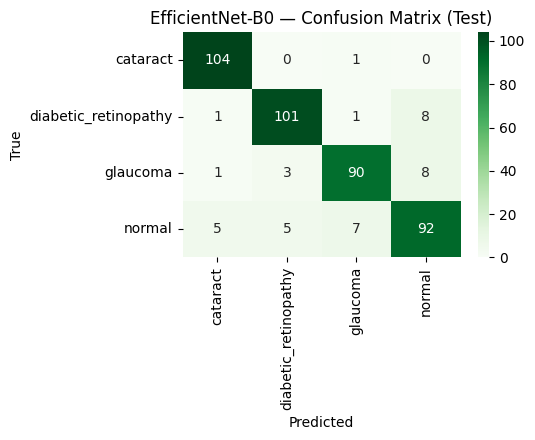

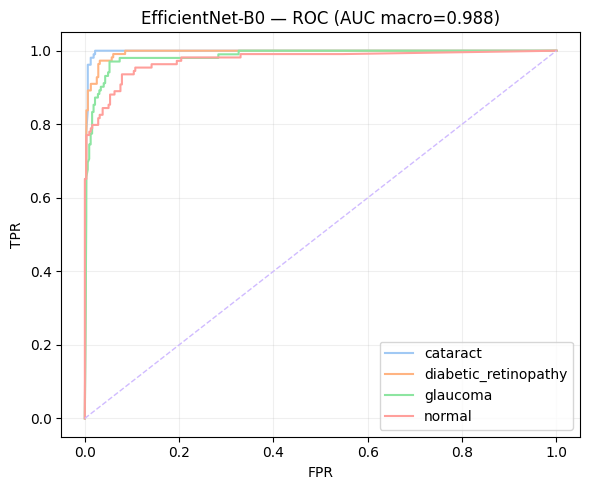

,Model,Best Val Acc,Test Acc,Test Precision(Macro),Test Recall(Macro),Test F1(Macro)
0,EfficientNet-B0,0.929845,0.906323,0.906121,0.906694,0.906148


In [ ]:
# Block: EfficientNet-B0
res = train_one_model('efficientnet_b0', 'EfficientNet-B0')
pd.DataFrame([res])

In [ ]:
# AlexNet training block
import torchvision.models as models

def build_alexnet(num_classes):
    model = models.alexnet(weights=models.AlexNet_Weights.DEFAULT)  # pretrained
    model.classifier[6] = nn.Linear(model.classifier[6].in_features, num_classes)
    return model

def train_alexnet():
    print("\n===== Training AlexNet =====")
    model = build_alexnet(NUM_CLASSES).to(device)

    optimizer = torch.optim.AdamW(model.parameters(), lr=INIT_LR, weight_decay=1e-4)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=2)
    criterion = nn.CrossEntropyLoss()
    scaler = GradScaler(enabled=torch.cuda.is_available())

    es = EarlyStopping(patience=PATIENCE, mode='max')
    history = []; best_state = None; best_val_acc = -np.inf

    for epoch in range(1, MAX_EPOCHS+1):
        print(f"Epoch {epoch}/{MAX_EPOCHS}")
        t0 = time.time()
        train_loss, train_acc, train_f1, _ = epoch_pass(model, train_loader, criterion, optimizer, scaler)
        val_loss, val_acc, val_f1, _ = epoch_pass(model, val_loader, criterion)
        dt = time.time()-t0

        scheduler.step(val_acc)
        history.append({'epoch': epoch, 'train_loss': train_loss, 'train_acc': train_acc,
                        'val_loss': val_loss, 'val_acc': val_acc, 'train_f1': train_f1, 'val_f1': val_f1,
                        'lr': optimizer.param_groups[0]['lr'], 'time_sec': dt})
        print(f"Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f} | Val F1: {val_f1:.4f} | LR: {optimizer.param_groups[0]['lr']:.2e}")

        if val_acc > best_val_acc + 1e-6:
            best_val_acc = val_acc
            best_state = {k:v.cpu() for k,v in model.state_dict().items()}
            save_path = os.path.join(OUT_DIR, "AlexNet_best.pth")
            torch.save(best_state, save_path)
            print("  ↳ New best model saved:", save_path)
        if not es.step(val_acc):
            pass
        if es.early_stop:
            print("Early stopping triggered.")
            break

    # Load best and evaluate on test
    if best_state is not None:
        try:
            model.load_state_dict({k:v.to(device) for k,v in best_state.items()}, strict=False)
        except Exception as e:
            print("Warning: loading best_state with strict=False ->", e)

    _, _, _, (y_true, y_pred, y_prob) = epoch_pass(model, test_loader, criterion)
    test_acc = accuracy_score(y_true, y_pred)
    prec, rec, f1, _ = precision_recall_fscore_support(y_true, y_pred, average='macro', zero_division=0)

    hist_df = pd.DataFrame(history)
    hist_df.to_csv(os.path.join(OUT_DIR, "AlexNet_history.csv"), index=False)
    report = classification_report(y_true, y_pred, target_names=CLASS_NAMES, output_dict=True, zero_division=0)
    pd.DataFrame(report).transpose().to_csv(os.path.join(OUT_DIR, "AlexNet_report.csv"))

    # Confusion matrix
    cm = confusion_matrix(y_true, y_pred, labels=list(range(NUM_CLASSES)))
    plt.figure(figsize=(5.5,4.5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Greens', xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES)
    plt.title("AlexNet — Confusion Matrix (Test)")
    plt.ylabel("True"); plt.xlabel("Predicted"); plt.tight_layout(); plt.show()

    # ROC OVR
    y_true_bin = label_binarize(y_true, classes=list(range(NUM_CLASSES)))
    try:
        auc_macro = roc_auc_score(y_true_bin, y_prob, average='macro', multi_class='ovr')
    except Exception:
        auc_macro = np.nan
    plt.figure(figsize=(6,5))
    for i in range(NUM_CLASSES):
        fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_prob[:, i])
        plt.plot(fpr, tpr, label=f"{CLASS_NAMES[i]}")
    plt.plot([0,1],[0,1],'--', lw=1)
    plt.title(f"AlexNet — ROC (AUC macro={auc_macro:.3f})")
    plt.xlabel("FPR"); plt.ylabel("TPR"); plt.legend(); plt.grid(True, alpha=0.2); plt.tight_layout(); plt.show()

    # ✅ Return as DataFrame for table display
    results_dict = {
        "Model": "AlexNet",
        "Best Val Acc": float(best_val_acc),
        "Test Acc": float(test_acc),
        "Test Precision(Macro)": float(prec),
        "Test Recall(Macro)": float(rec),
        "Test F1(Macro)": float(f1)
    }
    return pd.DataFrame([results_dict])



===== Training AlexNet =====
Epoch 1/60


/tmp/ipython-input-3312369673.py:16: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=torch.cuda.is_available())


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.6473 | Val Acc: 0.6849 | Val F1: 0.6680 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/AlexNet_best.pth
Epoch 2/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7121 | Val Acc: 0.7598 | Val F1: 0.7624 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/AlexNet_best.pth
Epoch 3/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7691 | Val Acc: 0.7919 | Val F1: 0.7933 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/AlexNet_best.pth
Epoch 4/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8393 | Val Acc: 0.8181 | Val F1: 0.8167 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/AlexNet_best.pth
Epoch 5/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8206 | Val Acc: 0.8157 | Val F1: 0.8117 | LR: 3.00e-04
Epoch 6/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8542 | Val Acc: 0.8038 | Val F1: 0.8041 | LR: 3.00e-04
Epoch 7/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8688 | Val Acc: 0.8407 | Val F1: 0.8411 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/AlexNet_best.pth
Epoch 8/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8715 | Val Acc: 0.8335 | Val F1: 0.8359 | LR: 3.00e-04
Epoch 9/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8881 | Val Acc: 0.8145 | Val F1: 0.8109 | LR: 3.00e-04
Epoch 10/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9013 | Val Acc: 0.8537 | Val F1: 0.8549 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/AlexNet_best.pth
Epoch 11/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9274 | Val Acc: 0.8371 | Val F1: 0.8370 | LR: 3.00e-04
Epoch 12/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9200 | Val Acc: 0.8704 | Val F1: 0.8703 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/AlexNet_best.pth
Epoch 13/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9332 | Val Acc: 0.8537 | Val F1: 0.8522 | LR: 3.00e-04
Epoch 14/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9285 | Val Acc: 0.8621 | Val F1: 0.8628 | LR: 3.00e-04
Epoch 15/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9366 | Val Acc: 0.8644 | Val F1: 0.8639 | LR: 1.50e-04
Epoch 16/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9607 | Val Acc: 0.8811 | Val F1: 0.8810 | LR: 1.50e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/AlexNet_best.pth
Epoch 17/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9691 | Val Acc: 0.8787 | Val F1: 0.8793 | LR: 1.50e-04
Epoch 18/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9732 | Val Acc: 0.8930 | Val F1: 0.8934 | LR: 1.50e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/AlexNet_best.pth
Epoch 19/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9793 | Val Acc: 0.8799 | Val F1: 0.8800 | LR: 1.50e-04
Epoch 20/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9712 | Val Acc: 0.8930 | Val F1: 0.8934 | LR: 1.50e-04
Epoch 21/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9793 | Val Acc: 0.8847 | Val F1: 0.8852 | LR: 7.50e-05
Epoch 22/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9868 | Val Acc: 0.8942 | Val F1: 0.8942 | LR: 7.50e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/AlexNet_best.pth
Epoch 23/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9905 | Val Acc: 0.9013 | Val F1: 0.9021 | LR: 7.50e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/AlexNet_best.pth
Epoch 24/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9902 | Val Acc: 0.9001 | Val F1: 0.9004 | LR: 7.50e-05
Epoch 25/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9912 | Val Acc: 0.9061 | Val F1: 0.9058 | LR: 7.50e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/AlexNet_best.pth
Epoch 26/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9915 | Val Acc: 0.8942 | Val F1: 0.8932 | LR: 7.50e-05
Epoch 27/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9959 | Val Acc: 0.8930 | Val F1: 0.8930 | LR: 7.50e-05
Epoch 28/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9871 | Val Acc: 0.9025 | Val F1: 0.9028 | LR: 3.75e-05
Epoch 29/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9946 | Val Acc: 0.9096 | Val F1: 0.9096 | LR: 3.75e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/AlexNet_best.pth
Epoch 30/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9946 | Val Acc: 0.9037 | Val F1: 0.9039 | LR: 3.75e-05
Epoch 31/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9966 | Val Acc: 0.9013 | Val F1: 0.9014 | LR: 3.75e-05
Epoch 32/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9953 | Val Acc: 0.9001 | Val F1: 0.9001 | LR: 1.87e-05
Epoch 33/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9963 | Val Acc: 0.9061 | Val F1: 0.9065 | LR: 1.87e-05
Epoch 34/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9980 | Val Acc: 0.9108 | Val F1: 0.9111 | LR: 1.87e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/AlexNet_best.pth
Epoch 35/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9980 | Val Acc: 0.9096 | Val F1: 0.9100 | LR: 1.87e-05
Epoch 36/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9976 | Val Acc: 0.9073 | Val F1: 0.9076 | LR: 1.87e-05
Epoch 37/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9983 | Val Acc: 0.9120 | Val F1: 0.9121 | LR: 1.87e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/AlexNet_best.pth
Epoch 38/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9976 | Val Acc: 0.9120 | Val F1: 0.9120 | LR: 1.87e-05
Epoch 39/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9976 | Val Acc: 0.9061 | Val F1: 0.9064 | LR: 1.87e-05
Epoch 40/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9993 | Val Acc: 0.9084 | Val F1: 0.9087 | LR: 9.37e-06
Epoch 41/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9973 | Val Acc: 0.9096 | Val F1: 0.9096 | LR: 9.37e-06
Epoch 42/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9993 | Val Acc: 0.9096 | Val F1: 0.9095 | LR: 9.37e-06
Early stopping triggered.


  0%|          | 0/14 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


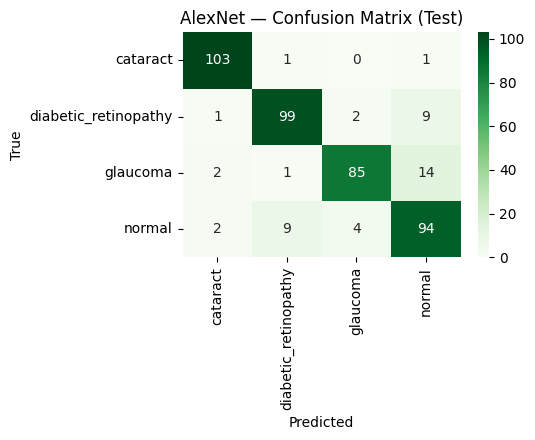

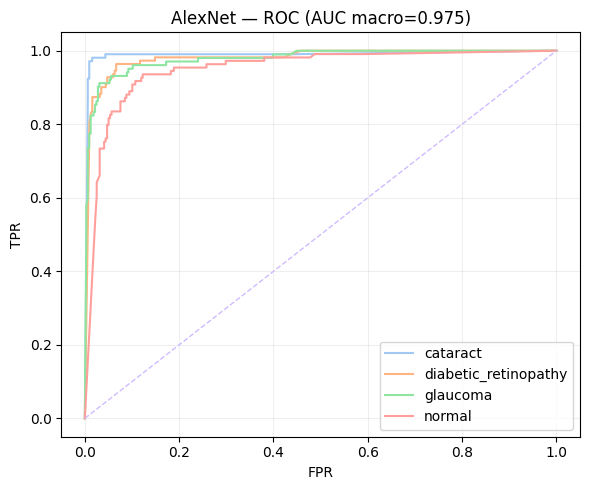

In [ ]:
alexnet_results = train_alexnet()

In [ ]:
display(alexnet_results)

,Model,Best Val Acc,Test Acc,Test Precision(Macro),Test Recall(Macro),Test F1(Macro)
0,AlexNet,0.91201,0.892272,0.896095,0.892141,0.893022



===== Training VGG19 (vgg19) =====


model.safetensors:   0%|          | 0.00/575M [00:00<?, ?B/s]

Epoch 1/60


/tmp/ipython-input-3870945229.py:75: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=torch.cuda.is_available())


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.5168 | Val Acc: 0.5755 | Val F1: 0.5680 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/VGG19_best.pth
Epoch 2/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.6233 | Val Acc: 0.6992 | Val F1: 0.7039 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/VGG19_best.pth
Epoch 3/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7280 | Val Acc: 0.7313 | Val F1: 0.7356 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/VGG19_best.pth
Epoch 4/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7389 | Val Acc: 0.7776 | Val F1: 0.7743 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/VGG19_best.pth
Epoch 5/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7874 | Val Acc: 0.7907 | Val F1: 0.7924 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/VGG19_best.pth
Epoch 6/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

Train Acc: 0.8152 | Val Acc: 0.7872 | Val F1: 0.7895 | LR: 3.00e-04
Epoch 7/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8125 | Val Acc: 0.7503 | Val F1: 0.7495 | LR: 3.00e-04
Epoch 8/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8444 | Val Acc: 0.7883 | Val F1: 0.7894 | LR: 1.50e-04
Epoch 9/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8718 | Val Acc: 0.8430 | Val F1: 0.8453 | LR: 1.50e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/VGG19_best.pth
Epoch 10/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9081 | Val Acc: 0.8312 | Val F1: 0.8349 | LR: 1.50e-04
Epoch 11/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9183 | Val Acc: 0.7931 | Val F1: 0.7958 | LR: 1.50e-04
Epoch 12/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

Train Acc: 0.9254 | Val Acc: 0.8597 | Val F1: 0.8618 | LR: 1.50e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/VGG19_best.pth
Epoch 13/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9346 | Val Acc: 0.8621 | Val F1: 0.8640 | LR: 1.50e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/VGG19_best.pth
Epoch 14/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9362 | Val Acc: 0.8680 | Val F1: 0.8693 | LR: 1.50e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/VGG19_best.pth
Epoch 15/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9451 | Val Acc: 0.8205 | Val F1: 0.8231 | LR: 1.50e-04
Epoch 16/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9505 | Val Acc: 0.8537 | Val F1: 0.8548 | LR: 1.50e-04
Epoch 17/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9617 | Val Acc: 0.8609 | Val F1: 0.8605 | LR: 7.50e-05
Epoch 18/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

Train Acc: 0.9759 | Val Acc: 0.8847 | Val F1: 0.8850 | LR: 7.50e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/VGG19_best.pth
Epoch 19/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9807 | Val Acc: 0.8692 | Val F1: 0.8699 | LR: 7.50e-05
Epoch 20/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9837 | Val Acc: 0.8728 | Val F1: 0.8741 | LR: 7.50e-05
Epoch 21/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9844 | Val Acc: 0.8704 | Val F1: 0.8717 | LR: 3.75e-05
Epoch 22/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9881 | Val Acc: 0.8728 | Val F1: 0.8741 | LR: 3.75e-05
Epoch 23/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9905 | Val Acc: 0.8882 | Val F1: 0.8888 | LR: 3.75e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/VGG19_best.pth
Epoch 24/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

Train Acc: 0.9939 | Val Acc: 0.8716 | Val F1: 0.8733 | LR: 3.75e-05
Epoch 25/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9939 | Val Acc: 0.8775 | Val F1: 0.8779 | LR: 3.75e-05
Epoch 26/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9946 | Val Acc: 0.8763 | Val F1: 0.8779 | LR: 1.87e-05
Epoch 27/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9963 | Val Acc: 0.8740 | Val F1: 0.8755 | LR: 1.87e-05
Epoch 28/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9966 | Val Acc: 0.8751 | Val F1: 0.8761 | LR: 1.87e-05
Early stopping triggered.


  0%|          | 0/14 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


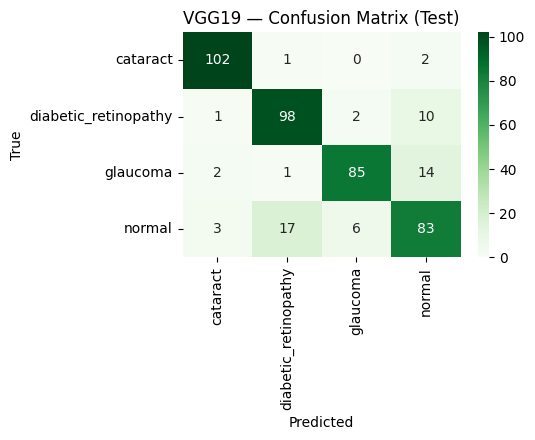

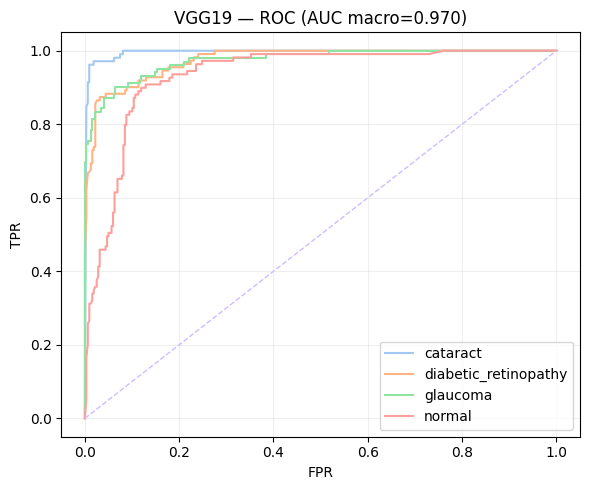

,Model,Best Val Acc,Test Acc,Test Precision(Macro),Test Recall(Macro),Test F1(Macro)
0,VGG19,0.888228,0.861827,0.864374,0.862278,0.862665


In [ ]:
# Block: VGG19
res = train_one_model('vgg19', 'VGG19')
pd.DataFrame([res])


===== Training ResNeXt-101 (resnext101_32x8d) =====


model.safetensors:   0%|          | 0.00/356M [00:00<?, ?B/s]

Epoch 1/60


/tmp/ipython-input-3870945229.py:75: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=torch.cuda.is_available())


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7460 | Val Acc: 0.7301 | Val F1: 0.7225 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ResNeXt-101_best.pth
Epoch 2/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8423 | Val Acc: 0.7574 | Val F1: 0.7558 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ResNeXt-101_best.pth
Epoch 3/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8756 | Val Acc: 0.8549 | Val F1: 0.8513 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ResNeXt-101_best.pth
Epoch 4/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8928 | Val Acc: 0.7955 | Val F1: 0.7920 | LR: 3.00e-04
Epoch 5/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8942 | Val Acc: 0.8026 | Val F1: 0.7955 | LR: 3.00e-04
Epoch 6/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9088 | Val Acc: 0.8954 | Val F1: 0.8959 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ResNeXt-101_best.pth
Epoch 7/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9264 | Val Acc: 0.8894 | Val F1: 0.8905 | LR: 3.00e-04
Epoch 8/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9379 | Val Acc: 0.8430 | Val F1: 0.8386 | LR: 3.00e-04
Epoch 9/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9430 | Val Acc: 0.8216 | Val F1: 0.8078 | LR: 1.50e-04
Epoch 10/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9596 | Val Acc: 0.9132 | Val F1: 0.9133 | LR: 1.50e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ResNeXt-101_best.pth
Epoch 11/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9752 | Val Acc: 0.9073 | Val F1: 0.9070 | LR: 1.50e-04
Epoch 12/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9736 | Val Acc: 0.9096 | Val F1: 0.9097 | LR: 1.50e-04
Epoch 13/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9807 | Val Acc: 0.9001 | Val F1: 0.8996 | LR: 7.50e-05
Epoch 14/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

Train Acc: 0.9875 | Val Acc: 0.9144 | Val F1: 0.9142 | LR: 7.50e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ResNeXt-101_best.pth
Epoch 15/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9919 | Val Acc: 0.9144 | Val F1: 0.9153 | LR: 7.50e-05
Epoch 16/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9949 | Val Acc: 0.9084 | Val F1: 0.9091 | LR: 7.50e-05
Epoch 17/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9919 | Val Acc: 0.9191 | Val F1: 0.9195 | LR: 7.50e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ResNeXt-101_best.pth
Epoch 18/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9942 | Val Acc: 0.9168 | Val F1: 0.9170 | LR: 7.50e-05
Epoch 19/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9946 | Val Acc: 0.9263 | Val F1: 0.9265 | LR: 7.50e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ResNeXt-101_best.pth
Epoch 20/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

Train Acc: 0.9888 | Val Acc: 0.9061 | Val F1: 0.9066 | LR: 7.50e-05
Epoch 21/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9922 | Val Acc: 0.9144 | Val F1: 0.9144 | LR: 7.50e-05
Epoch 22/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9925 | Val Acc: 0.9073 | Val F1: 0.9072 | LR: 3.75e-05
Epoch 23/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9932 | Val Acc: 0.9084 | Val F1: 0.9077 | LR: 3.75e-05
Epoch 24/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9969 | Val Acc: 0.9215 | Val F1: 0.9215 | LR: 3.75e-05
Early stopping triggered.


  0%|          | 0/14 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


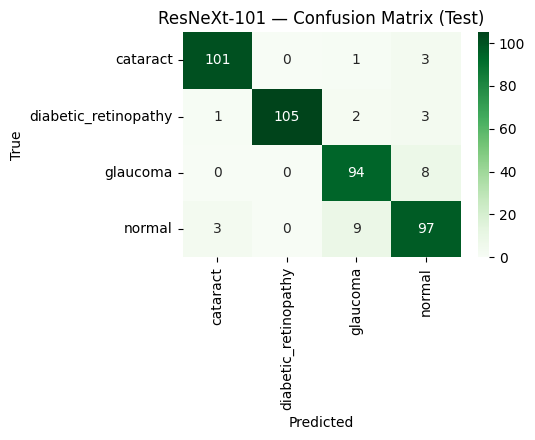

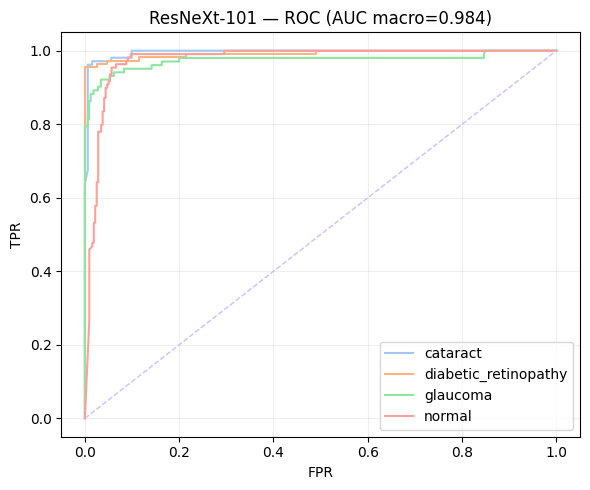

,Model,Best Val Acc,Test Acc,Test Precision(Macro),Test Recall(Macro),Test F1(Macro)
0,ResNeXt-101,0.926278,0.929742,0.930643,0.929832,0.929948


In [ ]:
# Block: ResNeXt-101
res = train_one_model('resnext101_32x8d', 'ResNeXt-101')
pd.DataFrame([res])


===== Training MobileNetV2 (mobilenetv2_100) =====


model.safetensors:   0%|          | 0.00/14.2M [00:00<?, ?B/s]

Epoch 1/60


/tmp/ipython-input-3870945229.py:75: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=torch.cuda.is_available())


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.6924 | Val Acc: 0.7836 | Val F1: 0.7851 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/MobileNetV2_best.pth
Epoch 2/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

Train Acc: 0.8416 | Val Acc: 0.8109 | Val F1: 0.8090 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/MobileNetV2_best.pth
Epoch 3/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8796 | Val Acc: 0.8300 | Val F1: 0.8281 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/MobileNetV2_best.pth
Epoch 4/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9125 | Val Acc: 0.8597 | Val F1: 0.8588 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/MobileNetV2_best.pth
Epoch 5/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9386 | Val Acc: 0.8478 | Val F1: 0.8490 | LR: 3.00e-04
Epoch 6/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9522 | Val Acc: 0.8680 | Val F1: 0.8688 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/MobileNetV2_best.pth
Epoch 7/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9532 | Val Acc: 0.8716 | Val F1: 0.8730 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/MobileNetV2_best.pth
Epoch 8/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9488 | Val Acc: 0.8847 | Val F1: 0.8857 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/MobileNetV2_best.pth
Epoch 9/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9566 | Val Acc: 0.8609 | Val F1: 0.8607 | LR: 3.00e-04
Epoch 10/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

Train Acc: 0.9685 | Val Acc: 0.8740 | Val F1: 0.8726 | LR: 3.00e-04
Epoch 11/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9644 | Val Acc: 0.8894 | Val F1: 0.8901 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/MobileNetV2_best.pth
Epoch 12/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9712 | Val Acc: 0.8763 | Val F1: 0.8758 | LR: 3.00e-04
Epoch 13/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9759 | Val Acc: 0.8930 | Val F1: 0.8930 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/MobileNetV2_best.pth
Epoch 14/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9817 | Val Acc: 0.9096 | Val F1: 0.9090 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/MobileNetV2_best.pth
Epoch 15/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9868 | Val Acc: 0.8930 | Val F1: 0.8934 | LR: 3.00e-04
Epoch 16/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

Train Acc: 0.9888 | Val Acc: 0.8859 | Val F1: 0.8872 | LR: 3.00e-04
Epoch 17/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9780 | Val Acc: 0.8835 | Val F1: 0.8839 | LR: 1.50e-04
Epoch 18/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9885 | Val Acc: 0.9001 | Val F1: 0.9003 | LR: 1.50e-04
Epoch 19/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9919 | Val Acc: 0.9013 | Val F1: 0.9015 | LR: 1.50e-04
Early stopping triggered.


  0%|          | 0/14 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


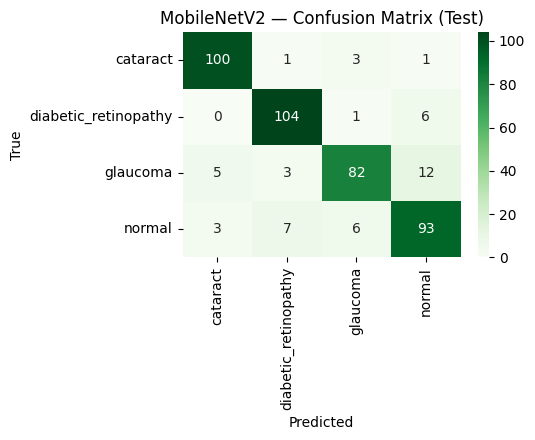

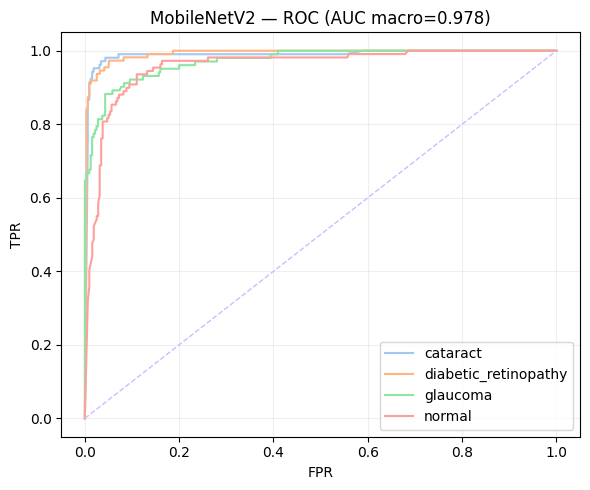

,Model,Best Val Acc,Test Acc,Test Precision(Macro),Test Recall(Macro),Test F1(Macro)
0,MobileNetV2,0.909631,0.887588,0.887984,0.886613,0.886578


In [ ]:
# Block: MobileNetV2
res = train_one_model('mobilenetv2_100', 'MobileNetV2')
pd.DataFrame([res])

In [ ]:
# SqueezeNet1.1 training block
import torchvision.models as models

def build_squeezenet(num_classes):
    model = models.squeezenet1_1(weights=models.SqueezeNet1_1_Weights.DEFAULT)  # pretrained
    # Replace final conv layer
    model.classifier[1] = nn.Conv2d(512, num_classes, kernel_size=(1,1))
    model.num_classes = num_classes
    return model

def train_squeezenet():
    print("\n===== Training SqueezeNet1.1 =====")
    model = build_squeezenet(NUM_CLASSES).to(device)

    optimizer = torch.optim.AdamW(model.parameters(), lr=INIT_LR, weight_decay=1e-4)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=2)
    criterion = nn.CrossEntropyLoss()
    scaler = GradScaler(enabled=torch.cuda.is_available())

    es = EarlyStopping(patience=PATIENCE, mode='max')
    history = []; best_state = None; best_val_acc = -np.inf

    for epoch in range(1, MAX_EPOCHS+1):
        print(f"Epoch {epoch}/{MAX_EPOCHS}")
        t0 = time.time()
        train_loss, train_acc, train_f1, _ = epoch_pass(model, train_loader, criterion, optimizer, scaler)
        val_loss, val_acc, val_f1, _ = epoch_pass(model, val_loader, criterion)
        dt = time.time()-t0

        scheduler.step(val_acc)
        history.append({'epoch': epoch, 'train_loss': train_loss, 'train_acc': train_acc,
                        'val_loss': val_loss, 'val_acc': val_acc, 'train_f1': train_f1, 'val_f1': val_f1,
                        'lr': optimizer.param_groups[0]['lr'], 'time_sec': dt})
        print(f"Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f} | Val F1: {val_f1:.4f} | LR: {optimizer.param_groups[0]['lr']:.2e}")

        if val_acc > best_val_acc + 1e-6:
            best_val_acc = val_acc
            best_state = {k:v.cpu() for k,v in model.state_dict().items()}
            save_path = os.path.join(OUT_DIR, "SqueezeNet1_1_best.pth")
            torch.save(best_state, save_path)
            print("  ↳ New best model saved:", save_path)
        if not es.step(val_acc):
            pass
        if es.early_stop:
            print("Early stopping triggered.")
            break

    # Load best and evaluate on test
    if best_state is not None:
        try:
            model.load_state_dict({k:v.to(device) for k,v in best_state.items()}, strict=False)
        except Exception as e:
            print("Warning: loading best_state with strict=False ->", e)

    _, _, _, (y_true, y_pred, y_prob) = epoch_pass(model, test_loader, criterion)
    test_acc = accuracy_score(y_true, y_pred)
    prec, rec, f1, _ = precision_recall_fscore_support(y_true, y_pred, average='macro', zero_division=0)

    hist_df = pd.DataFrame(history)
    hist_df.to_csv(os.path.join(OUT_DIR, "SqueezeNet1_1_history.csv"), index=False)
    report = classification_report(y_true, y_pred, target_names=CLASS_NAMES, output_dict=True, zero_division=0)
    pd.DataFrame(report).transpose().to_csv(os.path.join(OUT_DIR, "SqueezeNet1_1_report.csv"))

    # Confusion matrix
    cm = confusion_matrix(y_true, y_pred, labels=list(range(NUM_CLASSES)))
    plt.figure(figsize=(5.5,4.5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Greens', xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES)
    plt.title("SqueezeNet1.1 — Confusion Matrix (Test)")
    plt.ylabel("True"); plt.xlabel("Predicted"); plt.tight_layout(); plt.show()

    # ROC OVR
    y_true_bin = label_binarize(y_true, classes=list(range(NUM_CLASSES)))
    try:
        auc_macro = roc_auc_score(y_true_bin, y_prob, average='macro', multi_class='ovr')
    except Exception:
        auc_macro = np.nan
    plt.figure(figsize=(6,5))
    for i in range(NUM_CLASSES):
        fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_prob[:, i])
        plt.plot(fpr, tpr, label=f"{CLASS_NAMES[i]}")
    plt.plot([0,1],[0,1],'--', lw=1)
    plt.title(f"SqueezeNet1.1 — ROC (AUC macro={auc_macro:.3f})")
    plt.xlabel("FPR"); plt.ylabel("TPR"); plt.legend(); plt.grid(True, alpha=0.2); plt.tight_layout(); plt.show()

    # ✅ Return as DataFrame for table display
    results_dict = {
        "Model": "SqueezeNet1.1",
        "Best Val Acc": float(best_val_acc),
        "Test Acc": float(test_acc),
        "Test Precision(Macro)": float(prec),
        "Test Recall(Macro)": float(rec),
        "Test F1(Macro)": float(f1)
    }
    return pd.DataFrame([results_dict])


===== Training SqueezeNet1.1 =====
Epoch 1/60


/tmp/ipython-input-1947305125.py:18: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=torch.cuda.is_available())


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.5032 | Val Acc: 0.5517 | Val F1: 0.4787 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/SqueezeNet1_1_best.pth
Epoch 2/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.6494 | Val Acc: 0.7277 | Val F1: 0.7277 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/SqueezeNet1_1_best.pth
Epoch 3/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7121 | Val Acc: 0.7146 | Val F1: 0.7166 | LR: 3.00e-04
Epoch 4/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7481 | Val Acc: 0.7337 | Val F1: 0.7304 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/SqueezeNet1_1_best.pth
Epoch 5/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7874 | Val Acc: 0.7693 | Val F1: 0.7729 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/SqueezeNet1_1_best.pth
Epoch 6/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

Train Acc: 0.8020 | Val Acc: 0.7979 | Val F1: 0.7942 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/SqueezeNet1_1_best.pth
Epoch 7/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8104 | Val Acc: 0.8026 | Val F1: 0.7992 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/SqueezeNet1_1_best.pth
Epoch 8/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8284 | Val Acc: 0.8240 | Val F1: 0.8243 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/SqueezeNet1_1_best.pth
Epoch 9/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8284 | Val Acc: 0.8240 | Val F1: 0.8219 | LR: 3.00e-04
Epoch 10/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8535 | Val Acc: 0.7979 | Val F1: 0.8002 | LR: 3.00e-04
Epoch 11/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8406 | Val Acc: 0.8335 | Val F1: 0.8339 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/SqueezeNet1_1_best.pth
Epoch 12/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

Train Acc: 0.8379 | Val Acc: 0.8157 | Val F1: 0.8137 | LR: 3.00e-04
Epoch 13/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8671 | Val Acc: 0.8454 | Val F1: 0.8458 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/SqueezeNet1_1_best.pth
Epoch 14/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8722 | Val Acc: 0.8407 | Val F1: 0.8417 | LR: 3.00e-04
Epoch 15/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8813 | Val Acc: 0.8395 | Val F1: 0.8411 | LR: 3.00e-04
Epoch 16/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8715 | Val Acc: 0.8205 | Val F1: 0.8210 | LR: 1.50e-04
Epoch 17/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9078 | Val Acc: 0.8609 | Val F1: 0.8617 | LR: 1.50e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/SqueezeNet1_1_best.pth
Epoch 18/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

Train Acc: 0.9223 | Val Acc: 0.8644 | Val F1: 0.8661 | LR: 1.50e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/SqueezeNet1_1_best.pth
Epoch 19/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9196 | Val Acc: 0.8205 | Val F1: 0.8227 | LR: 1.50e-04
Epoch 20/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9169 | Val Acc: 0.8288 | Val F1: 0.8288 | LR: 1.50e-04
Epoch 21/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9193 | Val Acc: 0.8597 | Val F1: 0.8595 | LR: 7.50e-05
Epoch 22/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9518 | Val Acc: 0.8680 | Val F1: 0.8685 | LR: 7.50e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/SqueezeNet1_1_best.pth
Epoch 23/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9468 | Val Acc: 0.8751 | Val F1: 0.8761 | LR: 7.50e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/SqueezeNet1_1_best.pth
Epoch 24/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

Train Acc: 0.9505 | Val Acc: 0.8740 | Val F1: 0.8743 | LR: 7.50e-05
Epoch 25/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9573 | Val Acc: 0.8633 | Val F1: 0.8643 | LR: 7.50e-05
Epoch 26/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9630 | Val Acc: 0.8775 | Val F1: 0.8773 | LR: 7.50e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/SqueezeNet1_1_best.pth
Epoch 27/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9515 | Val Acc: 0.8728 | Val F1: 0.8738 | LR: 7.50e-05
Epoch 28/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9668 | Val Acc: 0.8633 | Val F1: 0.8630 | LR: 7.50e-05
Epoch 29/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9596 | Val Acc: 0.8680 | Val F1: 0.8676 | LR: 3.75e-05
Epoch 30/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

Train Acc: 0.9708 | Val Acc: 0.8823 | Val F1: 0.8829 | LR: 3.75e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/SqueezeNet1_1_best.pth
Epoch 31/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9732 | Val Acc: 0.8811 | Val F1: 0.8813 | LR: 3.75e-05
Epoch 32/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9786 | Val Acc: 0.8870 | Val F1: 0.8876 | LR: 3.75e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/SqueezeNet1_1_best.pth
Epoch 33/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9773 | Val Acc: 0.8728 | Val F1: 0.8732 | LR: 3.75e-05
Epoch 34/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9797 | Val Acc: 0.8799 | Val F1: 0.8799 | LR: 3.75e-05
Epoch 35/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9786 | Val Acc: 0.8751 | Val F1: 0.8751 | LR: 1.87e-05
Epoch 36/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

Train Acc: 0.9844 | Val Acc: 0.8799 | Val F1: 0.8806 | LR: 1.87e-05
Epoch 37/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9858 | Val Acc: 0.8847 | Val F1: 0.8848 | LR: 1.87e-05
Early stopping triggered.


  0%|          | 0/14 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


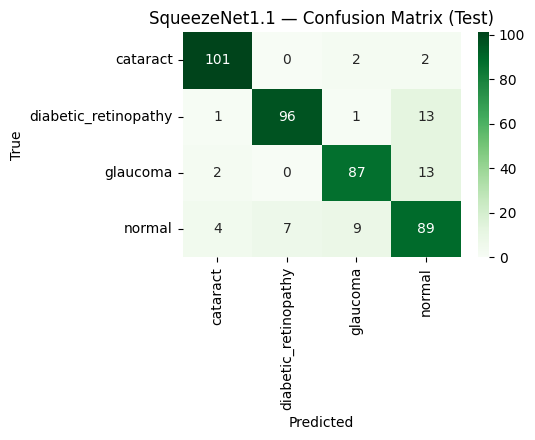

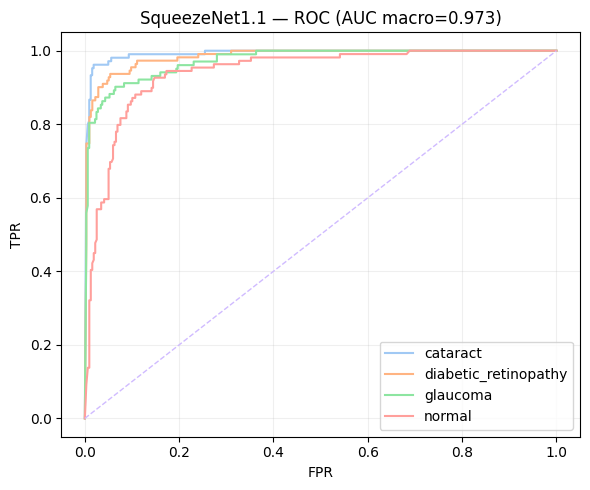

,Model,Best Val Acc,Test Acc,Test Precision(Macro),Test Recall(Macro),Test F1(Macro)
0,SqueezeNet1.1,0.887039,0.873536,0.876674,0.874056,0.874709


In [ ]:
squeezenet_results = train_squeezenet()
display(squeezenet_results)


===== Training CoaT-LiteTiny (coat_lite_tiny) =====


pytorch_model.bin:   0%|          | 0.00/23.0M [00:00<?, ?B/s]

Epoch 1/60


/tmp/ipython-input-3870945229.py:75: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=torch.cuda.is_available())


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7219 | Val Acc: 0.7574 | Val F1: 0.7514 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/CoaT-LiteTiny_best.pth
Epoch 2/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8650 | Val Acc: 0.8442 | Val F1: 0.8446 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/CoaT-LiteTiny_best.pth
Epoch 3/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8986 | Val Acc: 0.8704 | Val F1: 0.8709 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/CoaT-LiteTiny_best.pth
Epoch 4/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9132 | Val Acc: 0.8668 | Val F1: 0.8650 | LR: 3.00e-04
Epoch 5/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

Train Acc: 0.9396 | Val Acc: 0.8680 | Val F1: 0.8649 | LR: 3.00e-04
Epoch 6/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9474 | Val Acc: 0.8811 | Val F1: 0.8818 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/CoaT-LiteTiny_best.pth
Epoch 7/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9471 | Val Acc: 0.8740 | Val F1: 0.8729 | LR: 3.00e-04
Epoch 8/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9651 | Val Acc: 0.8728 | Val F1: 0.8723 | LR: 3.00e-04
Epoch 9/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9603 | Val Acc: 0.8870 | Val F1: 0.8876 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/CoaT-LiteTiny_best.pth
Epoch 10/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9620 | Val Acc: 0.8954 | Val F1: 0.8944 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/CoaT-LiteTiny_best.pth
Epoch 11/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9674 | Val Acc: 0.8823 | Val F1: 0.8796 | LR: 3.00e-04
Epoch 12/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9708 | Val Acc: 0.8894 | Val F1: 0.8876 | LR: 3.00e-04
Epoch 13/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9827 | Val Acc: 0.9001 | Val F1: 0.9000 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/CoaT-LiteTiny_best.pth
Epoch 14/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9898 | Val Acc: 0.8954 | Val F1: 0.8963 | LR: 3.00e-04
Epoch 15/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9847 | Val Acc: 0.8918 | Val F1: 0.8923 | LR: 3.00e-04
Epoch 16/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9780 | Val Acc: 0.8835 | Val F1: 0.8830 | LR: 1.50e-04
Epoch 17/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9827 | Val Acc: 0.9227 | Val F1: 0.9226 | LR: 1.50e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/CoaT-LiteTiny_best.pth
Epoch 18/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9956 | Val Acc: 0.9073 | Val F1: 0.9076 | LR: 1.50e-04
Epoch 19/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9942 | Val Acc: 0.9203 | Val F1: 0.9203 | LR: 1.50e-04
Epoch 20/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9936 | Val Acc: 0.9156 | Val F1: 0.9156 | LR: 7.50e-05
Epoch 21/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9973 | Val Acc: 0.9168 | Val F1: 0.9165 | LR: 7.50e-05
Epoch 22/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9986 | Val Acc: 0.9239 | Val F1: 0.9244 | LR: 7.50e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/CoaT-LiteTiny_best.pth
Epoch 23/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

Train Acc: 0.9969 | Val Acc: 0.9168 | Val F1: 0.9167 | LR: 7.50e-05
Epoch 24/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9993 | Val Acc: 0.9180 | Val F1: 0.9181 | LR: 7.50e-05
Epoch 25/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9986 | Val Acc: 0.9144 | Val F1: 0.9146 | LR: 3.75e-05
Epoch 26/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9973 | Val Acc: 0.9144 | Val F1: 0.9143 | LR: 3.75e-05
Epoch 27/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

Train Acc: 0.9986 | Val Acc: 0.9144 | Val F1: 0.9143 | LR: 3.75e-05
Early stopping triggered.


  0%|          | 0/14 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


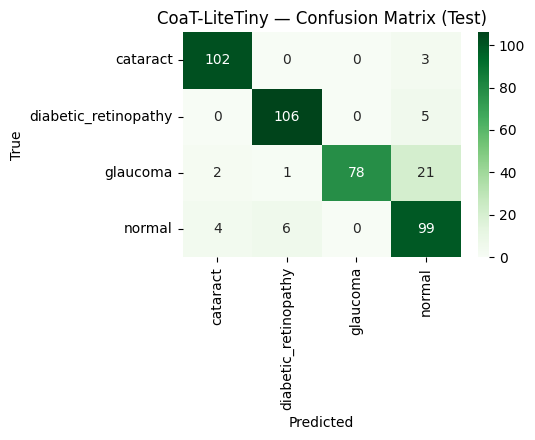

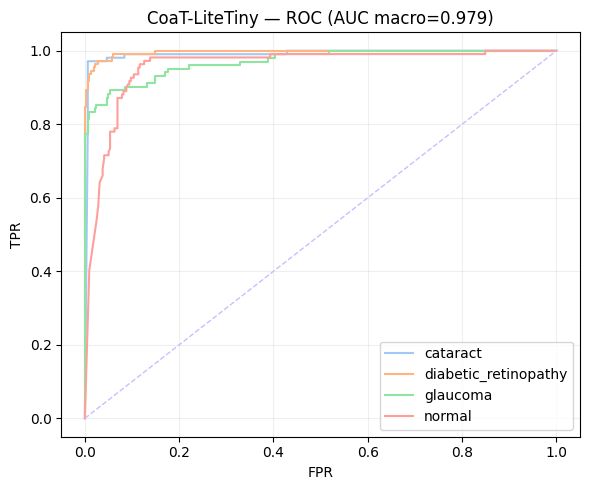

,Model,Best Val Acc,Test Acc,Test Precision(Macro),Test Recall(Macro),Test F1(Macro)
0,CoaT-LiteTiny,0.9239,0.901639,0.913984,0.899837,0.901571


In [ ]:
# Block: CoaT-LiteTiny
res = train_one_model('coat_lite_tiny', 'CoaT-LiteTiny')
pd.DataFrame([res])


===== Training EVA-02-B (eva02_base_patch14_224) =====


model.safetensors:   0%|          | 0.00/343M [00:00<?, ?B/s]

Epoch 1/60


/tmp/ipython-input-3870945229.py:75: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=torch.cuda.is_available())


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.2865 | Val Acc: 0.2925 | Val F1: 0.1661 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/EVA-02-B_best.pth
Epoch 2/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.2960 | Val Acc: 0.3044 | Val F1: 0.2480 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/EVA-02-B_best.pth
Epoch 3/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.3276 | Val Acc: 0.3401 | Val F1: 0.3042 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/EVA-02-B_best.pth
Epoch 4/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.3371 | Val Acc: 0.3591 | Val F1: 0.3001 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/EVA-02-B_best.pth
Epoch 5/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.3693 | Val Acc: 0.3650 | Val F1: 0.3030 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/EVA-02-B_best.pth
Epoch 6/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.4076 | Val Acc: 0.3567 | Val F1: 0.2619 | LR: 3.00e-04
Epoch 7/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.3828 | Val Acc: 0.3532 | Val F1: 0.2826 | LR: 3.00e-04
Epoch 8/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.4527 | Val Acc: 0.4958 | Val F1: 0.4686 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/EVA-02-B_best.pth
Epoch 9/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.5151 | Val Acc: 0.5410 | Val F1: 0.5411 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/EVA-02-B_best.pth
Epoch 10/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.5076 | Val Acc: 0.5446 | Val F1: 0.5445 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/EVA-02-B_best.pth
Epoch 11/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.5693 | Val Acc: 0.5719 | Val F1: 0.5553 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/EVA-02-B_best.pth
Epoch 12/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.5975 | Val Acc: 0.5981 | Val F1: 0.5969 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/EVA-02-B_best.pth
Epoch 13/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.6033 | Val Acc: 0.5874 | Val F1: 0.5849 | LR: 3.00e-04
Epoch 14/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.6250 | Val Acc: 0.5696 | Val F1: 0.5681 | LR: 3.00e-04
Epoch 15/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.6365 | Val Acc: 0.5684 | Val F1: 0.5694 | LR: 1.50e-04
Epoch 16/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.6463 | Val Acc: 0.6385 | Val F1: 0.6424 | LR: 1.50e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/EVA-02-B_best.pth
Epoch 17/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.6656 | Val Acc: 0.6647 | Val F1: 0.6509 | LR: 1.50e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/EVA-02-B_best.pth
Epoch 18/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.6833 | Val Acc: 0.6730 | Val F1: 0.6759 | LR: 1.50e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/EVA-02-B_best.pth
Epoch 19/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.6748 | Val Acc: 0.6706 | Val F1: 0.6674 | LR: 1.50e-04
Epoch 20/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7046 | Val Acc: 0.6742 | Val F1: 0.6794 | LR: 1.50e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/EVA-02-B_best.pth
Epoch 21/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7053 | Val Acc: 0.6837 | Val F1: 0.6835 | LR: 1.50e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/EVA-02-B_best.pth
Epoch 22/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.6938 | Val Acc: 0.6671 | Val F1: 0.6541 | LR: 1.50e-04
Epoch 23/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7162 | Val Acc: 0.6623 | Val F1: 0.6526 | LR: 1.50e-04
Epoch 24/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7311 | Val Acc: 0.6468 | Val F1: 0.6535 | LR: 7.50e-05
Epoch 25/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7362 | Val Acc: 0.7194 | Val F1: 0.7157 | LR: 7.50e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/EVA-02-B_best.pth
Epoch 26/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7521 | Val Acc: 0.7075 | Val F1: 0.7071 | LR: 7.50e-05
Epoch 27/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

Train Acc: 0.7565 | Val Acc: 0.7170 | Val F1: 0.7140 | LR: 7.50e-05
Epoch 28/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7406 | Val Acc: 0.7158 | Val F1: 0.7115 | LR: 3.75e-05
Epoch 29/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7701 | Val Acc: 0.7301 | Val F1: 0.7317 | LR: 3.75e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/EVA-02-B_best.pth
Epoch 30/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7820 | Val Acc: 0.7265 | Val F1: 0.7285 | LR: 3.75e-05
Epoch 31/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7786 | Val Acc: 0.7265 | Val F1: 0.7253 | LR: 3.75e-05
Epoch 32/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7776 | Val Acc: 0.7313 | Val F1: 0.7322 | LR: 3.75e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/EVA-02-B_best.pth
Epoch 33/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7820 | Val Acc: 0.7337 | Val F1: 0.7359 | LR: 3.75e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/EVA-02-B_best.pth
Epoch 34/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7813 | Val Acc: 0.7229 | Val F1: 0.7245 | LR: 3.75e-05
Epoch 35/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7955 | Val Acc: 0.7384 | Val F1: 0.7358 | LR: 3.75e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/EVA-02-B_best.pth
Epoch 36/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7898 | Val Acc: 0.7301 | Val F1: 0.7299 | LR: 3.75e-05
Epoch 37/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7894 | Val Acc: 0.7289 | Val F1: 0.7218 | LR: 3.75e-05
Epoch 38/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7938 | Val Acc: 0.7301 | Val F1: 0.7329 | LR: 1.87e-05
Epoch 39/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8094 | Val Acc: 0.7253 | Val F1: 0.7239 | LR: 1.87e-05
Epoch 40/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8104 | Val Acc: 0.7337 | Val F1: 0.7333 | LR: 1.87e-05
Early stopping triggered.


  0%|          | 0/14 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


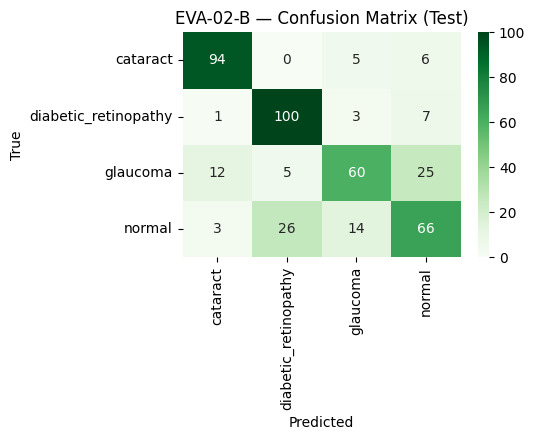

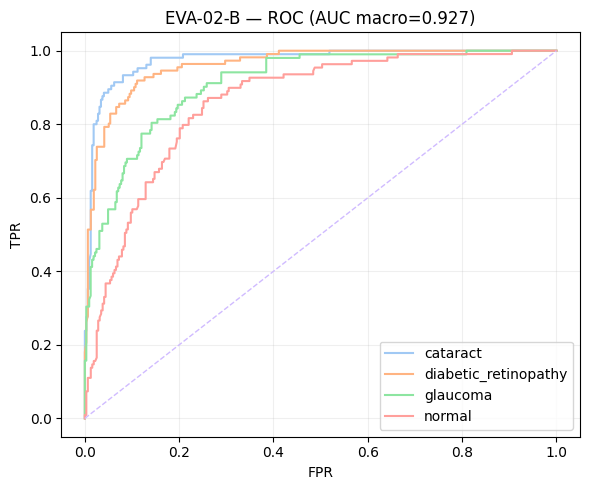

,Model,Best Val Acc,Test Acc,Test Precision(Macro),Test Recall(Macro),Test F1(Macro)
0,EVA-02-B,0.738407,0.749415,0.746057,0.74747,0.743189


In [ ]:
# Block: EVA-02-B
# Note: model name availability may depend on timm version; fallback if not available.
try:
    res = train_one_model('eva02_base_patch14_224', 'EVA-02-B')
except Exception as e:
    print('EVA model not available in timm version; skipping. Error:', e)
    res = None
res and pd.DataFrame([res])


===== Training MaxViT-Tiny (maxvit_tiny_tf_224) =====


model.safetensors:   0%|          | 0.00/124M [00:00<?, ?B/s]

Epoch 1/60


/tmp/ipython-input-3870945229.py:75: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=torch.cuda.is_available())


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7894 | Val Acc: 0.8442 | Val F1: 0.8451 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/MaxViT-Tiny_best.pth
Epoch 2/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8918 | Val Acc: 0.8656 | Val F1: 0.8671 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/MaxViT-Tiny_best.pth
Epoch 3/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9274 | Val Acc: 0.8668 | Val F1: 0.8686 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/MaxViT-Tiny_best.pth
Epoch 4/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9505 | Val Acc: 0.8811 | Val F1: 0.8825 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/MaxViT-Tiny_best.pth
Epoch 5/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9549 | Val Acc: 0.9037 | Val F1: 0.9031 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/MaxViT-Tiny_best.pth
Epoch 6/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9613 | Val Acc: 0.8966 | Val F1: 0.8973 | LR: 3.00e-04
Epoch 7/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9607 | Val Acc: 0.8966 | Val F1: 0.8961 | LR: 3.00e-04
Epoch 8/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9793 | Val Acc: 0.8918 | Val F1: 0.8908 | LR: 1.50e-04
Epoch 9/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9800 | Val Acc: 0.9168 | Val F1: 0.9164 | LR: 1.50e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/MaxViT-Tiny_best.pth
Epoch 10/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9902 | Val Acc: 0.9227 | Val F1: 0.9222 | LR: 1.50e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/MaxViT-Tiny_best.pth
Epoch 11/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9946 | Val Acc: 0.9251 | Val F1: 0.9256 | LR: 1.50e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/MaxViT-Tiny_best.pth
Epoch 12/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9956 | Val Acc: 0.9263 | Val F1: 0.9268 | LR: 1.50e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/MaxViT-Tiny_best.pth
Epoch 13/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9969 | Val Acc: 0.9227 | Val F1: 0.9232 | LR: 1.50e-04
Epoch 14/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9953 | Val Acc: 0.9358 | Val F1: 0.9361 | LR: 1.50e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/MaxViT-Tiny_best.pth
Epoch 15/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9969 | Val Acc: 0.9001 | Val F1: 0.9004 | LR: 1.50e-04
Epoch 16/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9905 | Val Acc: 0.9370 | Val F1: 0.9363 | LR: 1.50e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/MaxViT-Tiny_best.pth
Epoch 17/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9939 | Val Acc: 0.9227 | Val F1: 0.9218 | LR: 1.50e-04
Epoch 18/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9956 | Val Acc: 0.9322 | Val F1: 0.9319 | LR: 1.50e-04
Epoch 19/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9925 | Val Acc: 0.9215 | Val F1: 0.9217 | LR: 7.50e-05
Epoch 20/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9969 | Val Acc: 0.9358 | Val F1: 0.9357 | LR: 7.50e-05
Epoch 21/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9956 | Val Acc: 0.9251 | Val F1: 0.9257 | LR: 7.50e-05
Early stopping triggered.


  0%|          | 0/14 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process


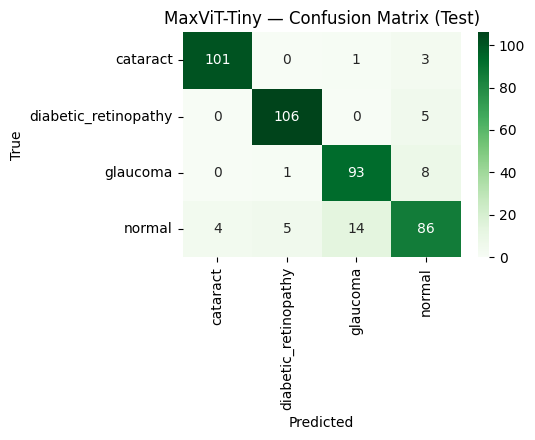

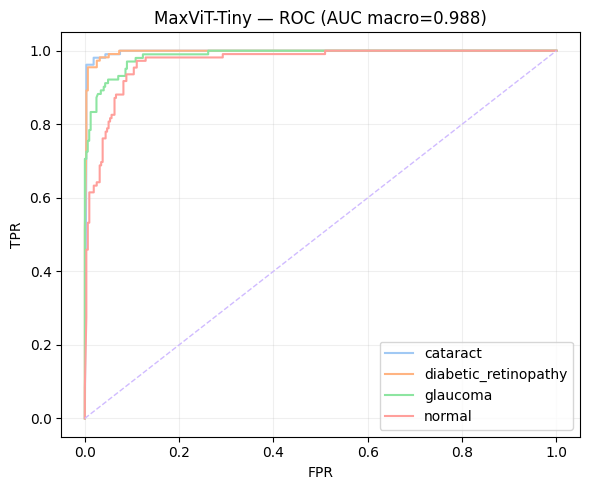

,Model,Best Val Acc,Test Acc,Test Precision(Macro),Test Recall(Macro),Test F1(Macro)
0,MaxViT-Tiny,0.93698,0.903981,0.903145,0.904404,0.903364


In [ ]:
# Block: MaxViT-Tiny
res = train_one_model('maxvit_tiny_tf_224', 'MaxViT-Tiny')
pd.DataFrame([res])


===== Training CaiT-XXS-24 (cait_xxs24_224) =====


model.safetensors:   0%|          | 0.00/47.9M [00:00<?, ?B/s]

Epoch 1/60


/tmp/ipython-input-3870945229.py:75: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=torch.cuda.is_available())


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.5693 | Val Acc: 0.7658 | Val F1: 0.7647 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/CaiT-XXS-24_best.pth
Epoch 2/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7616 | Val Acc: 0.7812 | Val F1: 0.7814 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/CaiT-XXS-24_best.pth
Epoch 3/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8471 | Val Acc: 0.8181 | Val F1: 0.8176 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/CaiT-XXS-24_best.pth
Epoch 4/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8586 | Val Acc: 0.7979 | Val F1: 0.8007 | LR: 3.00e-04
Epoch 5/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8749 | Val Acc: 0.8300 | Val F1: 0.8272 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/CaiT-XXS-24_best.pth
Epoch 6/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8840 | Val Acc: 0.8561 | Val F1: 0.8549 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/CaiT-XXS-24_best.pth
Epoch 7/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9017 | Val Acc: 0.8466 | Val F1: 0.8456 | LR: 3.00e-04
Epoch 8/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9132 | Val Acc: 0.8633 | Val F1: 0.8645 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/CaiT-XXS-24_best.pth
Epoch 9/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9386 | Val Acc: 0.8549 | Val F1: 0.8522 | LR: 3.00e-04
Epoch 10/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9335 | Val Acc: 0.8430 | Val F1: 0.8451 | LR: 3.00e-04
Epoch 11/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9434 | Val Acc: 0.8644 | Val F1: 0.8642 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/CaiT-XXS-24_best.pth
Epoch 12/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9498 | Val Acc: 0.8966 | Val F1: 0.8968 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/CaiT-XXS-24_best.pth
Epoch 13/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9502 | Val Acc: 0.8276 | Val F1: 0.8228 | LR: 3.00e-04
Epoch 14/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9495 | Val Acc: 0.8740 | Val F1: 0.8742 | LR: 3.00e-04
Epoch 15/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9546 | Val Acc: 0.8811 | Val F1: 0.8818 | LR: 1.50e-04
Epoch 16/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9759 | Val Acc: 0.8835 | Val F1: 0.8839 | LR: 1.50e-04
Epoch 17/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9847 | Val Acc: 0.9001 | Val F1: 0.9002 | LR: 1.50e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/CaiT-XXS-24_best.pth
Epoch 18/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9861 | Val Acc: 0.8966 | Val F1: 0.8967 | LR: 1.50e-04
Epoch 19/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9868 | Val Acc: 0.8989 | Val F1: 0.8991 | LR: 1.50e-04
Epoch 20/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9895 | Val Acc: 0.8882 | Val F1: 0.8880 | LR: 7.50e-05
Epoch 21/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9929 | Val Acc: 0.8966 | Val F1: 0.8971 | LR: 7.50e-05
Epoch 22/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9915 | Val Acc: 0.9061 | Val F1: 0.9060 | LR: 7.50e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/CaiT-XXS-24_best.pth
Epoch 23/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9949 | Val Acc: 0.9073 | Val F1: 0.9080 | LR: 7.50e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/CaiT-XXS-24_best.pth
Epoch 24/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9949 | Val Acc: 0.9084 | Val F1: 0.9087 | LR: 7.50e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/CaiT-XXS-24_best.pth
Epoch 25/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9956 | Val Acc: 0.9001 | Val F1: 0.8992 | LR: 7.50e-05
Epoch 26/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9963 | Val Acc: 0.9096 | Val F1: 0.9101 | LR: 7.50e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/CaiT-XXS-24_best.pth
Epoch 27/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9932 | Val Acc: 0.9001 | Val F1: 0.8997 | LR: 7.50e-05
Epoch 28/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9959 | Val Acc: 0.9013 | Val F1: 0.9012 | LR: 7.50e-05
Epoch 29/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9936 | Val Acc: 0.9013 | Val F1: 0.9008 | LR: 3.75e-05
Epoch 30/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9966 | Val Acc: 0.9073 | Val F1: 0.9077 | LR: 3.75e-05
Epoch 31/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9963 | Val Acc: 0.9061 | Val F1: 0.9061 | LR: 3.75e-05
Early stopping triggered.


  0%|          | 0/14 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


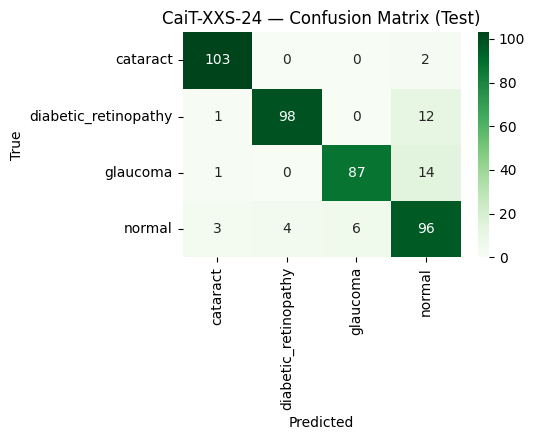

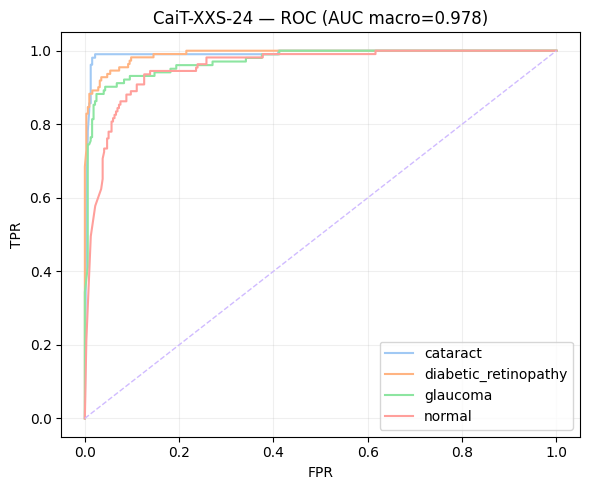

,Model,Best Val Acc,Test Acc,Test Precision(Macro),Test Recall(Macro),Test F1(Macro)
0,CaiT-XXS-24,0.909631,0.899297,0.906041,0.899378,0.900916


In [ ]:
# Block: CaiT-XXS-24
res = train_one_model('cait_xxs24_224', 'CaiT-XXS-24')
pd.DataFrame([res])


===== Training BeitB (beit_base_patch16_224) =====


model.safetensors:   0%|          | 0.00/350M [00:00<?, ?B/s]

Epoch 1/60


/tmp/ipython-input-3870945229.py:75: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=torch.cuda.is_available())


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.4218 | Val Acc: 0.4328 | Val F1: 0.3959 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/BeitB_best.pth
Epoch 2/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.5215 | Val Acc: 0.5589 | Val F1: 0.5558 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/BeitB_best.pth
Epoch 3/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.6019 | Val Acc: 0.5196 | Val F1: 0.5234 | LR: 3.00e-04
Epoch 4/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

Train Acc: 0.6168 | Val Acc: 0.5600 | Val F1: 0.5544 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/BeitB_best.pth
Epoch 5/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.6633 | Val Acc: 0.5791 | Val F1: 0.5756 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/BeitB_best.pth
Epoch 6/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.6595 | Val Acc: 0.6718 | Val F1: 0.6615 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/BeitB_best.pth
Epoch 7/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.6660 | Val Acc: 0.6766 | Val F1: 0.6756 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/BeitB_best.pth
Epoch 8/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.6890 | Val Acc: 0.6980 | Val F1: 0.6987 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/BeitB_best.pth
Epoch 9/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7213 | Val Acc: 0.6992 | Val F1: 0.6911 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/BeitB_best.pth
Epoch 10/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7260 | Val Acc: 0.7122 | Val F1: 0.7148 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/BeitB_best.pth
Epoch 11/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7413 | Val Acc: 0.7122 | Val F1: 0.7176 | LR: 3.00e-04
Epoch 12/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7698 | Val Acc: 0.6825 | Val F1: 0.6729 | LR: 3.00e-04
Epoch 13/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7813 | Val Acc: 0.7099 | Val F1: 0.7118 | LR: 1.50e-04
Epoch 14/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8288 | Val Acc: 0.7479 | Val F1: 0.7462 | LR: 1.50e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/BeitB_best.pth
Epoch 15/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8440 | Val Acc: 0.7705 | Val F1: 0.7743 | LR: 1.50e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/BeitB_best.pth
Epoch 16/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8457 | Val Acc: 0.7788 | Val F1: 0.7794 | LR: 1.50e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/BeitB_best.pth
Epoch 17/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8627 | Val Acc: 0.7705 | Val F1: 0.7717 | LR: 1.50e-04
Epoch 18/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8440 | Val Acc: 0.7955 | Val F1: 0.7949 | LR: 1.50e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/BeitB_best.pth
Epoch 19/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8718 | Val Acc: 0.8121 | Val F1: 0.8113 | LR: 1.50e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/BeitB_best.pth
Epoch 20/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8800 | Val Acc: 0.8050 | Val F1: 0.8031 | LR: 1.50e-04
Epoch 21/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8949 | Val Acc: 0.7848 | Val F1: 0.7848 | LR: 1.50e-04
Epoch 22/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8932 | Val Acc: 0.7990 | Val F1: 0.7980 | LR: 7.50e-05
Epoch 23/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9112 | Val Acc: 0.8145 | Val F1: 0.8142 | LR: 7.50e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/BeitB_best.pth
Epoch 24/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9386 | Val Acc: 0.8205 | Val F1: 0.8195 | LR: 7.50e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/BeitB_best.pth
Epoch 25/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9407 | Val Acc: 0.8193 | Val F1: 0.8201 | LR: 7.50e-05
Epoch 26/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9420 | Val Acc: 0.8264 | Val F1: 0.8273 | LR: 7.50e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/BeitB_best.pth
Epoch 27/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9488 | Val Acc: 0.7990 | Val F1: 0.7987 | LR: 7.50e-05
Epoch 28/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9546 | Val Acc: 0.8276 | Val F1: 0.8277 | LR: 7.50e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/BeitB_best.pth
Epoch 29/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9522 | Val Acc: 0.8276 | Val F1: 0.8276 | LR: 7.50e-05
Epoch 30/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9610 | Val Acc: 0.8228 | Val F1: 0.8235 | LR: 7.50e-05
Epoch 31/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9641 | Val Acc: 0.8300 | Val F1: 0.8304 | LR: 7.50e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/BeitB_best.pth
Epoch 32/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9647 | Val Acc: 0.8181 | Val F1: 0.8183 | LR: 7.50e-05
Epoch 33/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9586 | Val Acc: 0.8252 | Val F1: 0.8263 | LR: 7.50e-05
Epoch 34/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9763 | Val Acc: 0.8086 | Val F1: 0.8078 | LR: 3.75e-05
Epoch 35/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9746 | Val Acc: 0.8407 | Val F1: 0.8414 | LR: 3.75e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/BeitB_best.pth
Epoch 36/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9793 | Val Acc: 0.8371 | Val F1: 0.8376 | LR: 3.75e-05
Epoch 37/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9844 | Val Acc: 0.8359 | Val F1: 0.8356 | LR: 3.75e-05
Epoch 38/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9834 | Val Acc: 0.8300 | Val F1: 0.8279 | LR: 1.87e-05
Epoch 39/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9912 | Val Acc: 0.8395 | Val F1: 0.8398 | LR: 1.87e-05
Epoch 40/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9898 | Val Acc: 0.8216 | Val F1: 0.8224 | LR: 1.87e-05
Early stopping triggered.


  0%|          | 0/14 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


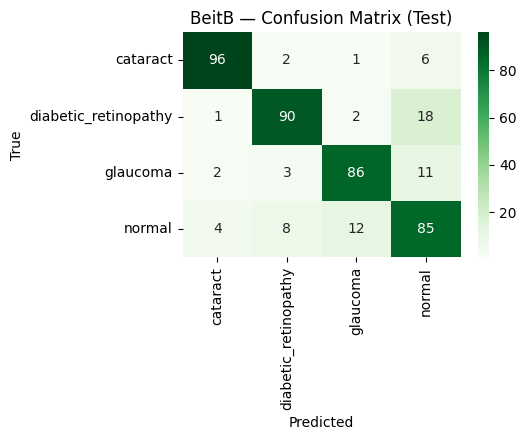

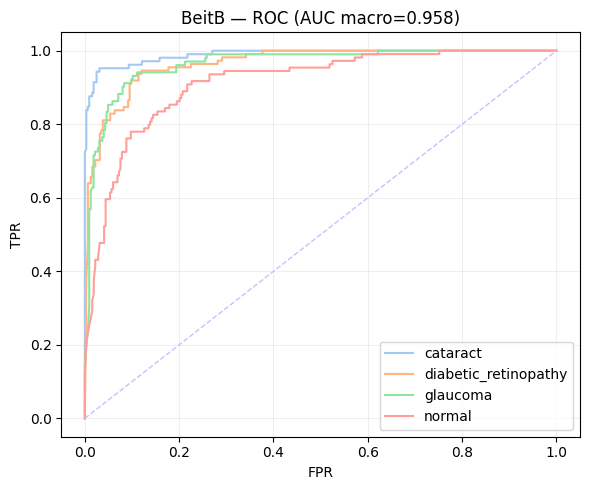

,Model,Best Val Acc,Test Acc,Test Precision(Macro),Test Recall(Macro),Test F1(Macro)
0,BeitB,0.840666,0.836066,0.841411,0.837013,0.838462


In [ ]:
# Block: BEiT-B
res = train_one_model('beit_base_patch16_224', 'BeitB')
pd.DataFrame([res])


===== Training ViT-B/16 =====
Epoch 1/60


/tmp/ipython-input-1013260029.py:17: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=torch.cuda.is_available())


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.4025 | Val Acc: 0.5517 | Val F1: 0.5234 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ViT-B/ViT-B_best.pth
Epoch 2/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.5690 | Val Acc: 0.6671 | Val F1: 0.6589 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ViT-B/ViT-B_best.pth
Epoch 3/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.6334 | Val Acc: 0.5981 | Val F1: 0.5341 | LR: 3.00e-04
Epoch 4/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.6623 | Val Acc: 0.6908 | Val F1: 0.6824 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ViT-B/ViT-B_best.pth
Epoch 5/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.6962 | Val Acc: 0.6338 | Val F1: 0.6354 | LR: 3.00e-04
Epoch 6/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7104 | Val Acc: 0.6564 | Val F1: 0.6122 | LR: 3.00e-04
Epoch 7/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7372 | Val Acc: 0.7360 | Val F1: 0.7406 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ViT-B/ViT-B_best.pth
Epoch 8/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7687 | Val Acc: 0.7503 | Val F1: 0.7452 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ViT-B/ViT-B_best.pth
Epoch 9/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7908 | Val Acc: 0.7776 | Val F1: 0.7770 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ViT-B/ViT-B_best.pth
Epoch 10/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7928 | Val Acc: 0.7229 | Val F1: 0.7192 | LR: 3.00e-04
Epoch 11/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.7860 | Val Acc: 0.7931 | Val F1: 0.7906 | LR: 3.00e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ViT-B/ViT-B_best.pth
Epoch 12/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8084 | Val Acc: 0.7574 | Val F1: 0.7610 | LR: 3.00e-04
Epoch 13/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8128 | Val Acc: 0.7598 | Val F1: 0.7660 | LR: 3.00e-04
Epoch 14/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8338 | Val Acc: 0.6956 | Val F1: 0.6891 | LR: 1.50e-04
Epoch 15/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8749 | Val Acc: 0.8109 | Val F1: 0.8095 | LR: 1.50e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ViT-B/ViT-B_best.pth
Epoch 16/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9000 | Val Acc: 0.8181 | Val F1: 0.8171 | LR: 1.50e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ViT-B/ViT-B_best.pth
Epoch 17/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8959 | Val Acc: 0.8121 | Val F1: 0.8091 | LR: 1.50e-04
Epoch 18/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.8901 | Val Acc: 0.8240 | Val F1: 0.8219 | LR: 1.50e-04
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ViT-B/ViT-B_best.pth
Epoch 19/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

Train Acc: 0.8989 | Val Acc: 0.8074 | Val F1: 0.8106 | LR: 1.50e-04
Epoch 20/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9196 | Val Acc: 0.8121 | Val F1: 0.8125 | LR: 1.50e-04
Epoch 21/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9057 | Val Acc: 0.8216 | Val F1: 0.8230 | LR: 7.50e-05
Epoch 22/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9424 | Val Acc: 0.8514 | Val F1: 0.8509 | LR: 7.50e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ViT-B/ViT-B_best.pth
Epoch 23/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

Train Acc: 0.9539 | Val Acc: 0.8335 | Val F1: 0.8349 | LR: 7.50e-05
Epoch 24/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9613 | Val Acc: 0.8454 | Val F1: 0.8443 | LR: 7.50e-05
Epoch 25/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9556 | Val Acc: 0.8383 | Val F1: 0.8393 | LR: 3.75e-05
Epoch 26/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9664 | Val Acc: 0.8514 | Val F1: 0.8509 | LR: 3.75e-05
Epoch 27/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9705 | Val Acc: 0.8621 | Val F1: 0.8624 | LR: 3.75e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ViT-B/ViT-B_best.pth
Epoch 28/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9742 | Val Acc: 0.8407 | Val F1: 0.8396 | LR: 3.75e-05
Epoch 29/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9769 | Val Acc: 0.8680 | Val F1: 0.8682 | LR: 3.75e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ViT-B/ViT-B_best.pth
Epoch 30/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9820 | Val Acc: 0.8585 | Val F1: 0.8590 | LR: 3.75e-05
Epoch 31/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9827 | Val Acc: 0.8597 | Val F1: 0.8595 | LR: 3.75e-05
Epoch 32/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9807 | Val Acc: 0.8692 | Val F1: 0.8688 | LR: 3.75e-05
  ↳ New best model saved: /content/drive/MyDrive/eye_models/ViT-B/ViT-B_best.pth
Epoch 33/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9837 | Val Acc: 0.8668 | Val F1: 0.8677 | LR: 3.75e-05
Epoch 34/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9824 | Val Acc: 0.8621 | Val F1: 0.8628 | LR: 3.75e-05
Epoch 35/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9858 | Val Acc: 0.8502 | Val F1: 0.8506 | LR: 1.87e-05
Epoch 36/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9861 | Val Acc: 0.8644 | Val F1: 0.8642 | LR: 1.87e-05
Epoch 37/60


  0%|          | 0/93 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x79f1bbdfe2a0>
Traceback (most recent call last):
  File "

  0%|          | 0/27 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


Train Acc: 0.9898 | Val Acc: 0.8585 | Val F1: 0.8589 | LR: 1.87e-05
Early stopping triggered.


  0%|          | 0/14 [00:00<?, ?it/s]

/tmp/ipython-input-3870945229.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):


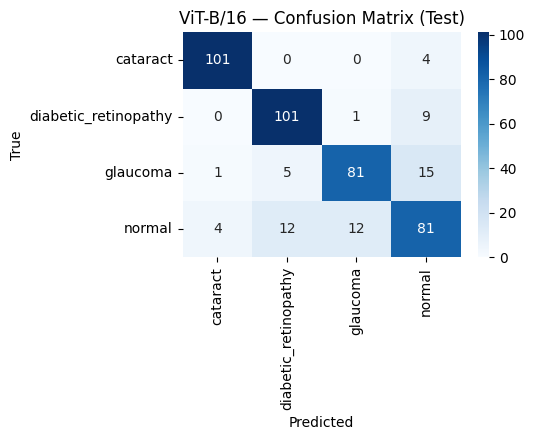

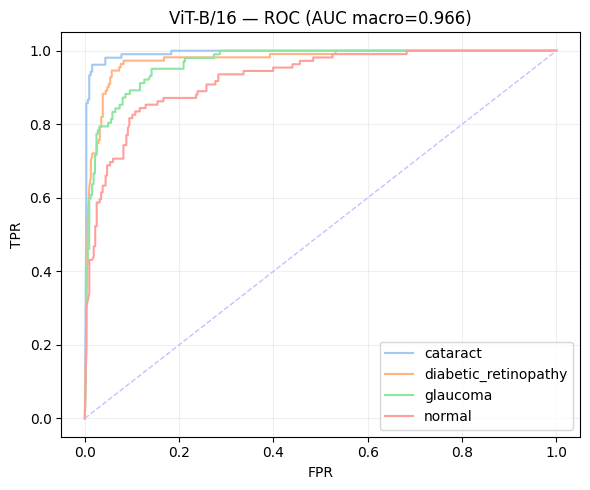

{'Model': 'ViT-B/16',
 'Best Val Acc': 0.8692033293687643,
 'Test Acc': 0.8524590163934426,
 'Test Precision(Macro)': 0.853395946445924,
 'Test Recall(Macro)': 0.8522628962321352,
 'Test F1(Macro)': 0.85227297993323}

In [ ]:
# ViT-B/16 training block
import timm

def build_vitb(num_classes):
    # Use timm's pretrained ViT-B/16
    model = timm.create_model("vit_base_patch16_224", pretrained=True)
    model.head = nn.Linear(model.head.in_features, num_classes)
    return model

def train_vitb():
    print("\n===== Training ViT-B/16 =====")
    model = build_vitb(NUM_CLASSES).to(device)

    optimizer = torch.optim.AdamW(model.parameters(), lr=INIT_LR, weight_decay=1e-4)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=2)
    criterion = nn.CrossEntropyLoss()
    scaler = GradScaler(enabled=torch.cuda.is_available())

    es = EarlyStopping(patience=PATIENCE, mode='max')
    history = []; best_state = None; best_val_acc = -np.inf

    for epoch in range(1, MAX_EPOCHS+1):
        print(f"Epoch {epoch}/{MAX_EPOCHS}")
        t0 = time.time()
        train_loss, train_acc, train_f1, _ = epoch_pass(model, train_loader, criterion, optimizer, scaler)
        val_loss, val_acc, val_f1, _ = epoch_pass(model, val_loader, criterion)
        dt = time.time()-t0

        scheduler.step(val_acc)
        history.append({'epoch': epoch, 'train_loss': train_loss, 'train_acc': train_acc,
                        'val_loss': val_loss, 'val_acc': val_acc, 'train_f1': train_f1, 'val_f1': val_f1,
                        'lr': optimizer.param_groups[0]['lr'], 'time_sec': dt})
        print(f"Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f} | Val F1: {val_f1:.4f} | LR: {optimizer.param_groups[0]['lr']:.2e}")

        if val_acc > best_val_acc + 1e-6:
            best_val_acc = val_acc
            best_state = {k:v.cpu() for k,v in model.state_dict().items()}
            OUT_DIR = os.path.join("/content/drive/MyDrive/eye_models", "ViT-B")
            os.makedirs(OUT_DIR, exist_ok=True)
            save_path = os.path.join(OUT_DIR, "ViT-B_best.pth")
            torch.save(best_state, save_path)
            print("  ↳ New best model saved:", save_path)
        if not es.step(val_acc):
            pass
        if es.early_stop:
            print("Early stopping triggered.")
            break

    # Load best model
    if best_state is not None:
        try:
            model.load_state_dict({k:v.to(device) for k,v in best_state.items()}, strict=False)
        except Exception as e:
            print("Warning: loading best_state with strict=False ->", e)

    # Test evaluation
    _, _, _, (y_true, y_pred, y_prob) = epoch_pass(model, test_loader, criterion)
    test_acc = accuracy_score(y_true, y_pred)
    prec, rec, f1, _ = precision_recall_fscore_support(y_true, y_pred, average='macro', zero_division=0)

    # Save history + report
    hist_df = pd.DataFrame(history)
    OUT_DIR = os.path.join("/content/drive/MyDrive/eye_models", "ViT-B")
    hist_df.to_csv(os.path.join(OUT_DIR, "ViT-B_history.csv"), index=False)
    report = classification_report(y_true, y_pred, target_names=CLASS_NAMES, output_dict=True, zero_division=0)
    pd.DataFrame(report).transpose().to_csv(os.path.join(OUT_DIR, "ViT-B_report.csv"))

    # Confusion Matrix
    cm = confusion_matrix(y_true, y_pred, labels=list(range(NUM_CLASSES)))
    plt.figure(figsize=(5.5,4.5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES)
    plt.title("ViT-B/16 — Confusion Matrix (Test)")
    plt.ylabel("True"); plt.xlabel("Predicted"); plt.tight_layout(); plt.show()

    # ROC Curve
    y_true_bin = label_binarize(y_true, classes=list(range(NUM_CLASSES)))
    try:
        auc_macro = roc_auc_score(y_true_bin, y_prob, average='macro', multi_class='ovr')
    except Exception:
        auc_macro = np.nan
    plt.figure(figsize=(6,5))
    for i in range(NUM_CLASSES):
        fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_prob[:, i])
        plt.plot(fpr, tpr, label=f"{CLASS_NAMES[i]}")
    plt.plot([0,1],[0,1],'--', lw=1)
    plt.title(f"ViT-B/16 — ROC (AUC macro={auc_macro:.3f})")
    plt.xlabel("FPR"); plt.ylabel("TPR"); plt.legend(); plt.grid(True, alpha=0.2); plt.tight_layout(); plt.show()

    return {
        "Model": "ViT-B/16",
        "Best Val Acc": float(best_val_acc),
        "Test Acc": float(test_acc),
        "Test Precision(Macro)": float(prec),
        "Test Recall(Macro)": float(rec),
        "Test F1(Macro)": float(f1)
    }
vitb16_results = train_vitb()
display(vitb16_results)


,Model,Best Val Acc,Test Acc,Precision (Macro),Recall (Macro),F1 (Macro)
2,DenseNet169,0.936980,0.925059,0.924807,0.925391,0.924965
11,MaxViT-Tiny,0.936980,0.903981,0.903145,0.904404,0.903364
3,EfficientNet-B0,0.929845,0.906323,0.906121,0.906694,0.906148
6,ResNeXt-101,0.926278,0.929742,0.930643,0.929832,0.929948
9,CoaT-LiteTiny,0.923900,0.901639,0.913984,0.899837,0.901571
1,ConvNeXt-Tiny,0.920333,0.918033,0.918534,0.917979,0.917973
0,ResNet50,0.920333,0.906323,0.905624,0.906623,0.905960
4,AlexNet,0.912010,0.892272,0.896095,0.892141,0.893022
12,CaiT-XXS-24,0.909631,0.899297,0.906041,0.899378,0.900916
7,MobileNetV2,0.909631,0.887588,0.887984,0.886613,0.886578


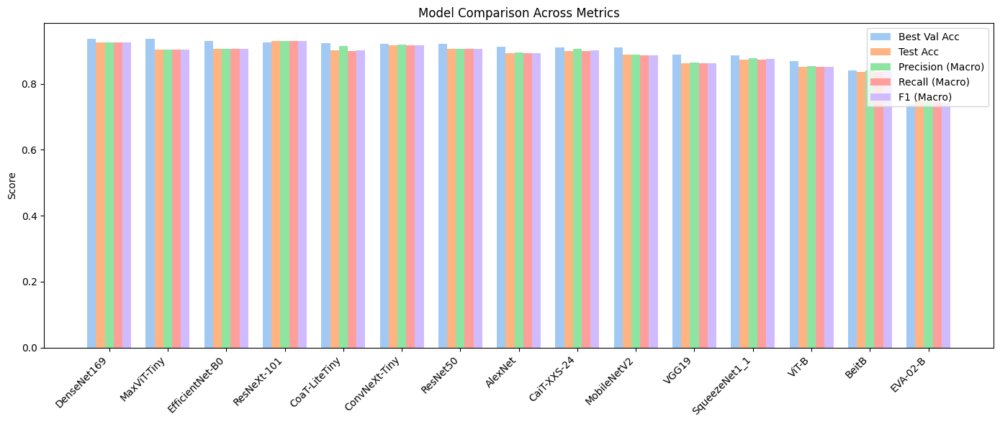

In [ ]:
# Cell — Aggregator for all models (recursive search with grouped bar chart)
import glob

BASE_OUT_DIR = "/content/drive/MyDrive/eye_models"

summary = []

# Find all *_report.csv recursively
for report_file in glob.glob(os.path.join(BASE_OUT_DIR, "**", "*_report.csv"), recursive=True):
    # Extract model name from file name, not folder
    model_name = os.path.basename(report_file).replace("_report.csv", "")

    hist_file = report_file.replace("_report.csv", "_history.csv")

    val_acc = np.nan
    test_acc = np.nan
    prec = np.nan
    rec = np.nan
    f1 = np.nan

    # read history to get best val_acc
    if os.path.exists(hist_file):
        try:
            h = pd.read_csv(hist_file)
            if "val_acc" in h.columns:
                best_row = h.loc[h["val_acc"].idxmax()]
                val_acc = float(best_row["val_acc"])
        except Exception as e:
            print(f"Could not read {hist_file}: {e}")

    # read report to get test metrics
    try:
        rep = pd.read_csv(report_file, index_col=0)
        if "accuracy" in rep.index:
            test_acc = rep.loc["accuracy", "precision"] if "precision" in rep.columns else np.nan
        if "macro avg" in rep.index:
            prec = rep.loc["macro avg", "precision"]
            rec = rep.loc["macro avg", "recall"]
            f1 = rep.loc["macro avg", "f1-score"]
    except Exception as e:
        print(f"Could not read {report_file}: {e}")

    summary.append({
        "Model": model_name,
        "Best Val Acc": val_acc,
        "Test Acc": test_acc,
        "Precision (Macro)": prec,
        "Recall (Macro)": rec,
        "F1 (Macro)": f1
    })

# Final summary DataFrame
res_df = pd.DataFrame(summary).sort_values("Best Val Acc", ascending=False)
display(res_df)

# --- Grouped Bar Plot ---
metrics = ["Best Val Acc", "Test Acc", "Precision (Macro)", "Recall (Macro)", "F1 (Macro)"]

x = np.arange(len(res_df))  # model positions
width = 0.15                # bar width

plt.figure(figsize=(14,6))
for i, metric in enumerate(metrics):
    plt.bar(x + i*width, res_df[metric], width, label=metric)

plt.ylabel("Score")
plt.xticks(x + width*(len(metrics)-1)/2, res_df["Model"], rotation=45, ha="right")
plt.legend()
plt.title("Model Comparison Across Metrics")
plt.tight_layout()
plt.show()


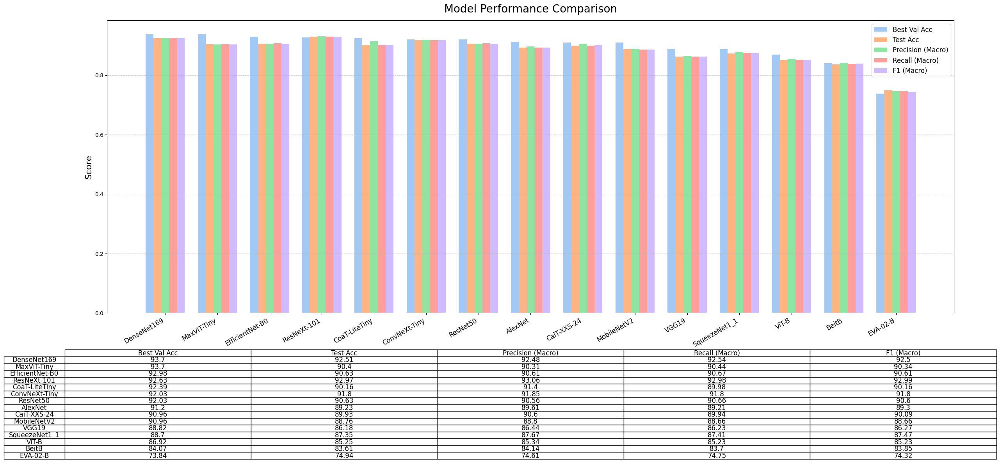

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Example res_df (replace with your actual results DataFrame)
# res_df = pd.DataFrame([
#     {"Model":"AlexNet","Best Val Acc":0.85,"Test Acc":0.83,"Precision (Macro)":0.82,"Recall (Macro)":0.81,"F1 (Macro)":0.815},
#     {"Model":"ResNet50","Best Val Acc":0.91,"Test Acc":0.90,"Precision (Macro)":0.89,"Recall (Macro)":0.88,"F1 (Macro)":0.885}
# ])

metrics = ["Best Val Acc", "Test Acc", "Precision (Macro)", "Recall (Macro)", "F1 (Macro)"]
models = res_df["Model"].values
n_models = len(models)
n_metrics = len(metrics)

# --- Bigger graph but same compact table ---
fig, (ax1, ax2) = plt.subplots(
    2, 1, figsize=(28,14), gridspec_kw={"height_ratios":[4,1]}
)

# --- Grouped Bar Plot ---
x = np.arange(n_models)
width = 0.15

for i, metric in enumerate(metrics):
    ax1.bar(x + i*width, res_df[metric], width, label=metric)

ax1.set_ylabel("Score", fontsize=16)
ax1.set_title("Model Performance Comparison", fontsize=20, pad=15)
ax1.set_xticks(x + width*(n_metrics-1)/2)
ax1.set_xticklabels(models, rotation=30, ha="right", fontsize=12)
ax1.legend(fontsize=12)
ax1.grid(axis="y", linestyle="--", alpha=0.6)

# --- Table ---
ax2.axis("off")
table_data = (res_df.set_index("Model")[metrics] * 100).round(2)

the_table = ax2.table(
    cellText=table_data.values,
    rowLabels=table_data.index,
    colLabels=table_data.columns,
    cellLoc="center",
    rowLoc="center",
    loc="center"
)

the_table.auto_set_font_size(False)
the_table.set_fontsize(12)
the_table.scale(1.1, 1.1)  # keep table compact

plt.subplots_adjust(hspace=0.3)
plt.show()
